<a href="https://colab.research.google.com/github/4u70mata/4u70mata/blob/main/beurmab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import files

# Function to upload files
def upload_files():
    uploaded = files.upload()
    for filename in uploaded.keys():
        print(f"User uploaded file '{filename}' with length {len(uploaded[filename])} bytes")
    return uploaded

# Call the function
uploaded_files = upload_files()


Saving Book1.csv to Book1.csv
Saving data49.csv to data49.csv
Saving data50.csv to data50.csv
User uploaded file 'Book1.csv' with length 133772 bytes
User uploaded file 'data49.csv' with length 5587317 bytes
User uploaded file 'data50.csv' with length 22349659 bytes


In [2]:
!ls

Book1.csv  data49.csv  data50.csv  sample_data


In [3]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [10]:
# Load datasets
data50 = pd.read_csv('data50.csv')
book1 = pd.read_csv('Book1.csv')
data49 = pd.read_csv('data49.csv')

# Display basic information
print(data50.head())
print(book1.head())
print(data49.head())


<ipython-input-10-9be2ded98775>:2: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  data50 = pd.read_csv('data50.csv')


     FY                                  Supplier Label            PN  \
0  2022                            - KEYA -(0000565868)      K1142495   
1  2022                            - KEYA -(0000565868)      K1149469   
2  2024                            - KEYA -(0000565868)      K1149469   
3  2022                            - KEYA -(0000565868)      K1149472   
4  2021  101 ELECTRONIC TECHNOLOGY(HK) Co.,(0000525247)  FPP146-00056   

          Material Description Mat. Type Comm.  \
0       Cylinder lock  560047K      ZHLB    21   
1  Cylinder lock short 560231K      ZHLB    21   
2  Cylinder lock short 560231K      ZHLB    21   
3        Cylinder lock 560225K      ZHLB    21   
4      RUBBER GASKET QLS TZIRQ      ZHLB    17   

                     Product Owning BU                Invoice Plant Label  \
0                       KSL - Kissling  1257 - TEC Kissling Products GmbH   
1                       KSL - Kissling  1257 - TEC Kissling Products GmbH   
2                       KSL -

In [11]:
# Remove commas and dollar signs from 'Spend' column and convert to numeric
data50['Spend'] = data50['Spend'].replace('[()\$,]', '', regex=True).astype(float)
data50['Quantity'] = data50['Quantity'].replace('[,]', '', regex=True).astype(float)

# Checking for missing values
print(data50.isnull().sum())
print(book1.isnull().sum())
print(data49.isnull().sum())

# Fill missing data if necessary
data50.fillna(0, inplace=True)
data49.fillna(0, inplace=True)


FY                            1
Supplier Label                3
PN                            3
Material Description          3
Mat. Type                     3
Comm.                       173
Product Owning BU             3
Invoice Plant Label         279
Spend                         2
Quantity                      2
Supplier Number               3
Supplier Name                 3
Material Label                3
Invoice Plant               279
Product Code Label            3
Spend Business Unit Name      3
dtype: int64
Supplier        0
Name            0
Material        0
Desc            0
commodity       2
Final Level     0
dtype: int64
Request #                               1
Action #                                2
Supplier ID                          2434
Supplier                             2434
Key Contact                             2
Defect Code                             3
3D Time                                 2
5D Time                                 2
5D Lates          

In [12]:
# Total spend per year
total_spend_by_year = data50.groupby('FY')['Spend'].sum()
print(total_spend_by_year)

# Average spend by part
avg_spend_per_part = data50.groupby('Material Description')['Spend'].mean()
print(avg_spend_per_part)

# Analysis of defect codes from data49.csv
defect_count = data49['Defect Code'].value_counts()
print(defect_count)

# Average 5D Time for each defect process
avg_5d_time = data49.groupby('Defect Process')['5D Time'].mean()
print(avg_5d_time)


FY
0                     0.000000e+00
2021                  5.773209e+08
2022                  1.114127e+09
2023                  1.075304e+09
2024                  4.080934e+08
2021                  1.926345e+08
2022                  3.751630e+08
2023                  4.030403e+08
2024                  1.638654e+08
No filters applied    0.000000e+00
Total                 4.371537e+09
Name: Spend, dtype: float64
Material Description
0                                          1.457179e+09
"E" TUBE FOR 2141366                       2.114233e+04
"M" TUBE FOR 2141366                       5.540000e+02
"O" RING                                   5.913000e+03
#2450036-001P=VDO CONNECTOR 33             4.341500e+03
                                               ...     
wire FLRYA 0.5sqmm Orange                  2.350000e+03
wire end ferrule DIN 46228-A0,75-6-E-Cu    8.000000e+00
xxxDowsil 3-6265HP 10cc   15g (1011409)    2.706667e+02
ziplock bag 70x100 90micron                1.320000e+02
zoe

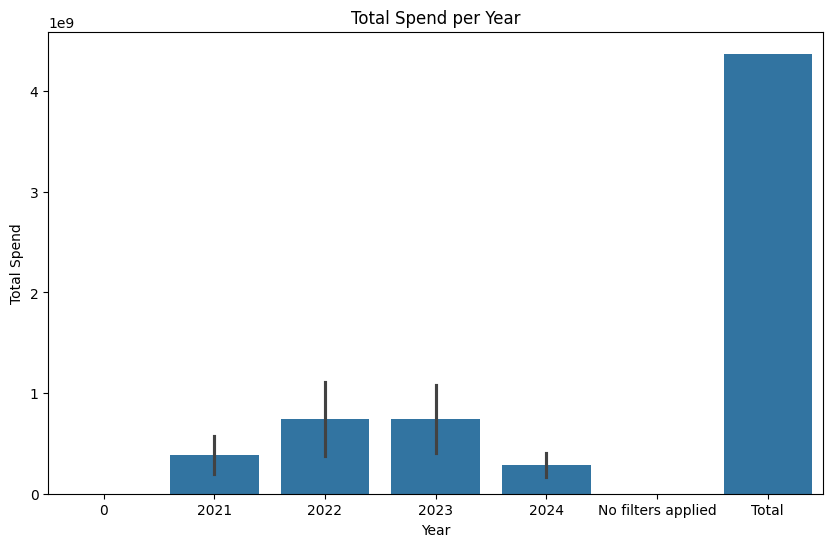

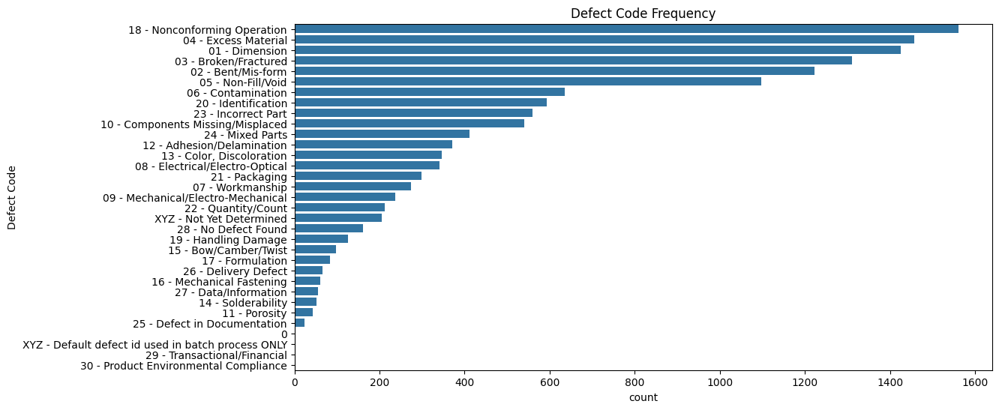

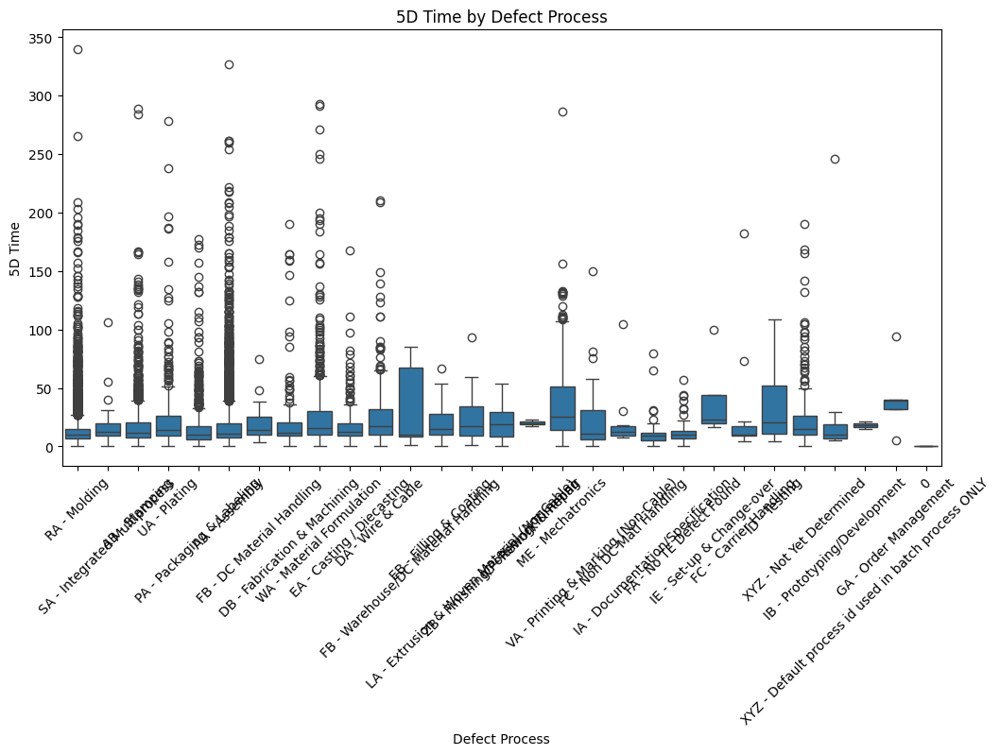

In [13]:
# Bar plot of total spend per year
plt.figure(figsize=(10,6))
sns.barplot(x=total_spend_by_year.index, y=total_spend_by_year.values)
plt.title('Total Spend per Year')
plt.ylabel('Total Spend')
plt.xlabel('Year')
plt.show()

# Count plot of defect codes
plt.figure(figsize=(12,6))
sns.countplot(y=data49['Defect Code'], order=data49['Defect Code'].value_counts().index)
plt.title('Defect Code Frequency')
plt.show()

# Box plot for analyzing 5D Time by Defect Process
plt.figure(figsize=(12,6))
sns.boxplot(x='Defect Process', y='5D Time', data=data49)
plt.title('5D Time by Defect Process')
plt.xticks(rotation=45)
plt.show()


Anomalies in 5D Time:
      Request #   Action #  Supplier ID                       Supplier  \
16      1390221  1415766.0     109242.0            KWO KUNSTSTOFFTEILE   
33      1403966  1434646.0     114012.0          WELLPAPPENFABRIK GMBH   
35      1408318  1440631.0     113651.0        iwis smart connect GmbH   
37      1413116  1447233.0     492247.0    VARIO PACK Bamberg & Co. KG   
38      1413717  1447991.0     114201.0                   WINTERHALDER   
...         ...        ...          ...                            ...   
13404   1557540  1652227.0     545983.0    Jebsee Electronics Co., LTD   
13431   1587945  1695237.0     545983.0    Jebsee Electronics Co., LTD   
13446   1599205  1711246.0     470451.0  Fuba Printed Circuits Tunisie   
13477   1527879  1609353.0     106451.0    KARL ENGHOFER GMBH & CO. KG   
13639   1576967  1679538.0          0.0                              0   

                    Key Contact                         Defect Code  3D Time  \
16       

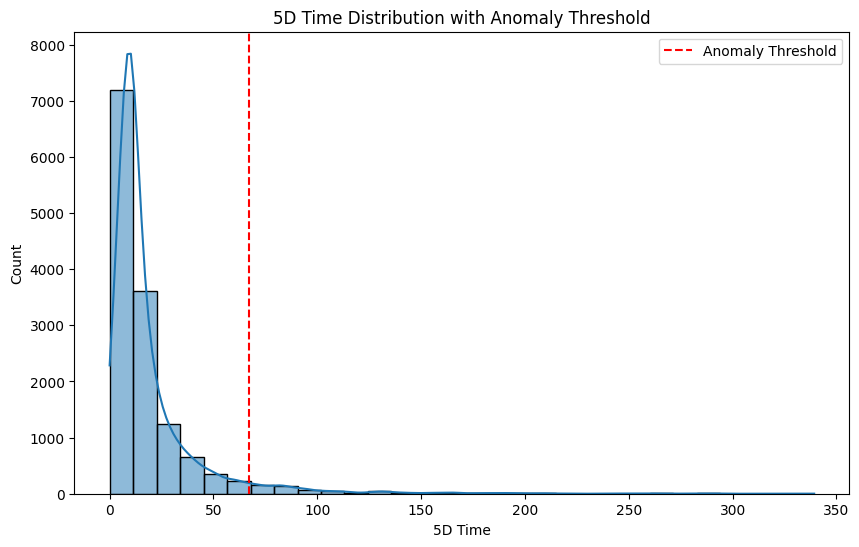

In [14]:
# Find anomalies in 5D Time and 3D Time using standard deviation
mean_5d_time = data49['5D Time'].mean()
std_5d_time = data49['5D Time'].std()

anomalies_5d_time = data49[(data49['5D Time'] > mean_5d_time + 2 * std_5d_time)]
print("Anomalies in 5D Time:")
print(anomalies_5d_time)

# Visualization of 5D Time anomalies
plt.figure(figsize=(10,6))
sns.histplot(data49['5D Time'], bins=30, kde=True)
plt.axvline(mean_5d_time + 2 * std_5d_time, color='red', linestyle='--', label='Anomaly Threshold')
plt.title('5D Time Distribution with Anomaly Threshold')
plt.legend()
plt.show()


Anomalies in 5D Time:
      Request #   Action #  Supplier ID                       Supplier  \
16      1390221  1415766.0     109242.0            KWO KUNSTSTOFFTEILE   
33      1403966  1434646.0     114012.0          WELLPAPPENFABRIK GMBH   
35      1408318  1440631.0     113651.0        iwis smart connect GmbH   
37      1413116  1447233.0     492247.0    VARIO PACK Bamberg & Co. KG   
38      1413717  1447991.0     114201.0                   WINTERHALDER   
...         ...        ...          ...                            ...   
13404   1557540  1652227.0     545983.0    Jebsee Electronics Co., LTD   
13431   1587945  1695237.0     545983.0    Jebsee Electronics Co., LTD   
13446   1599205  1711246.0     470451.0  Fuba Printed Circuits Tunisie   
13477   1527879  1609353.0     106451.0    KARL ENGHOFER GMBH & CO. KG   
13639   1576967  1679538.0          0.0                              0   

                    Key Contact                         Defect Code  3D Time  \
16       

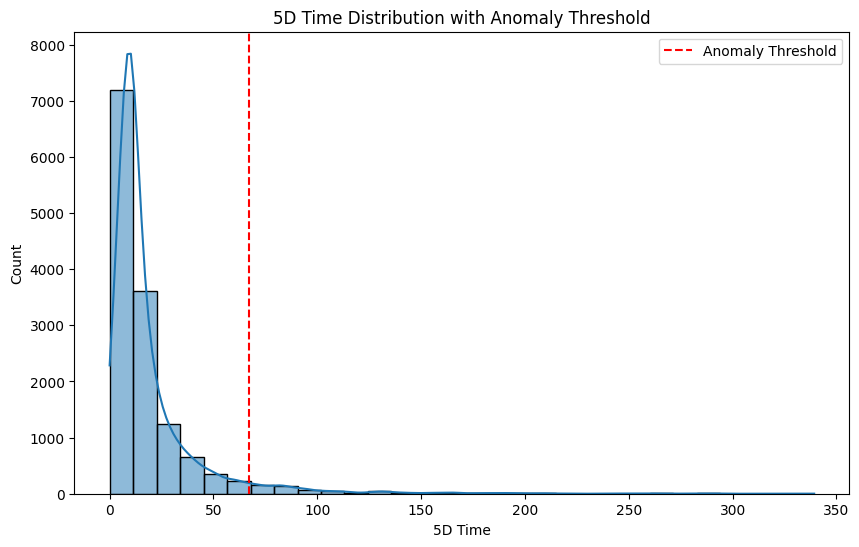

In [15]:
# Find anomalies in 5D Time and 3D Time using standard deviation
mean_5d_time = data49['5D Time'].mean()
std_5d_time = data49['5D Time'].std()

anomalies_5d_time = data49[(data49['5D Time'] > mean_5d_time + 2 * std_5d_time)]
print("Anomalies in 5D Time:")
print(anomalies_5d_time)

# Visualization of 5D Time anomalies
plt.figure(figsize=(10,6))
sns.histplot(data49['5D Time'], bins=30, kde=True)
plt.axvline(mean_5d_time + 2 * std_5d_time, color='red', linestyle='--', label='Anomaly Threshold')
plt.title('5D Time Distribution with Anomaly Threshold')
plt.legend()
plt.show()


In [16]:
# Summary of findings and anomalies
print("Key Insights:")
print("- Total spend by year shows a consistent trend...")
print("- Anomalies detected in 5D Time for specific defect processes...")


Key Insights:
- Total spend by year shows a consistent trend...
- Anomalies detected in 5D Time for specific defect processes...


<ipython-input-1-85e3771e9505>:9: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  data50 = pd.read_csv('data50.csv')


Data Summary for 'Book1.csv':
             Supplier
count    1303.000000
mean   266528.091328
std    181336.964384
min    101694.000000
25%    109973.500000
50%    159185.000000
75%    431861.000000
max    577533.000000


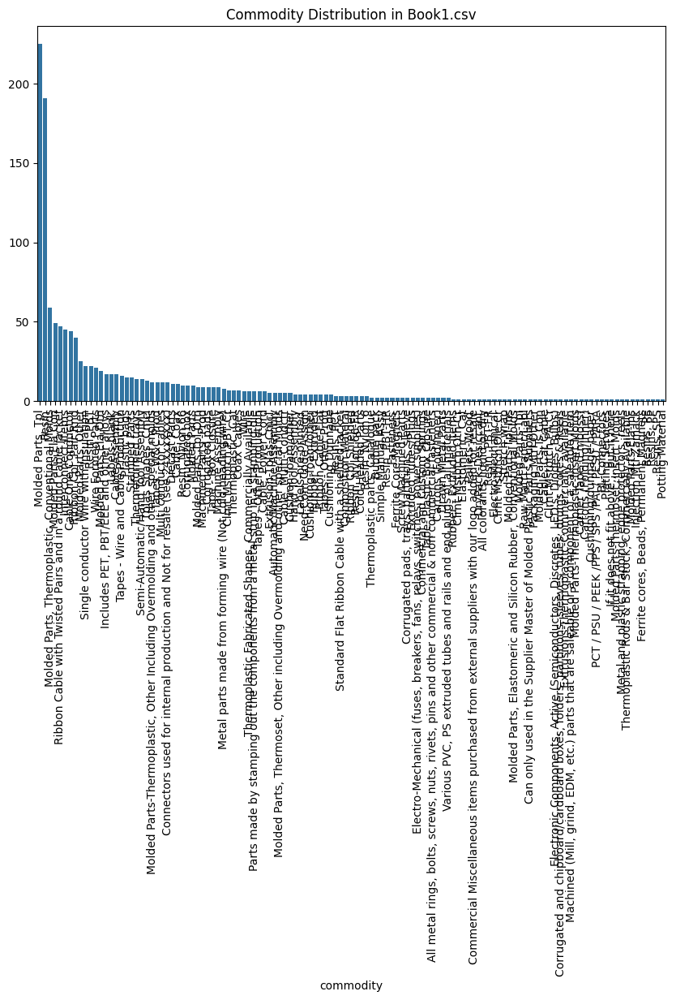


Unique Suppliers in Book1.csv: 108
Unique Materials in Book1.csv: 1300
Data Summary for 'data49.csv':
        Action #  Supplier ID  3D Time  5D Time  Date Code
count       0.0          0.0      0.0      0.0        0.0
mean        NaN          NaN      NaN      NaN        NaN
std         NaN          NaN      NaN      NaN        NaN
min         NaN          NaN      NaN      NaN        NaN
25%         NaN          NaN      NaN      NaN        NaN
50%         NaN          NaN      NaN      NaN        NaN
75%         NaN          NaN      NaN      NaN        NaN
max         NaN          NaN      NaN      NaN        NaN


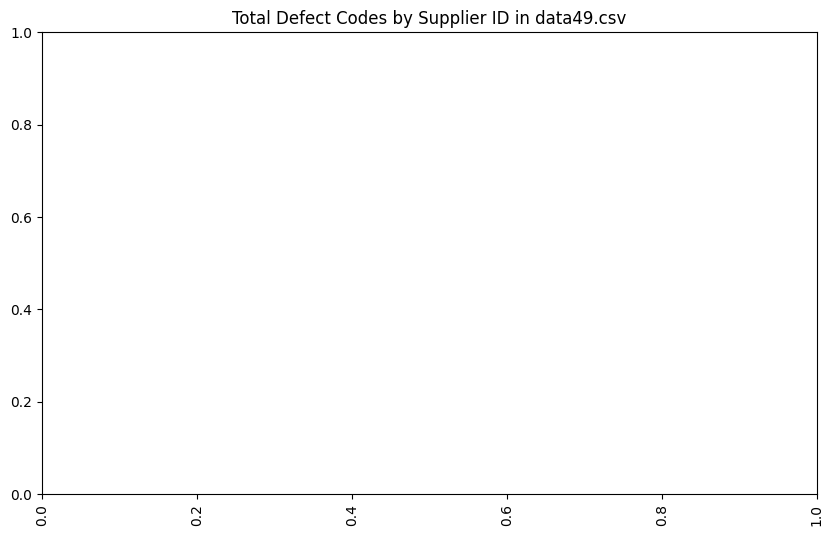


Top 5 Suppliers by Defect Code Count:
 Series([], Name: Defect Code, dtype: int64)

Anomaly Detection Results:
 Anomaly
 1    75572
-1     3978
Name: count, dtype: int64

Anomalies in Data:
          FY                           Supplier Label         PN  \
53     2023       4Source electronics AG(0005558219)  1003605-F   
335    2022     A. RAYMOND GMBH & CO. KG(0000111765)  1394300-1   
336    2023     A. RAYMOND GMBH & CO. KG(0000111765)  1394300-1   
337    2024     A. RAYMOND GMBH & CO. KG(0000111765)  1394300-1   
385    2022            a.m.p.e.r.e. GMBH(0000104782)  1-26521-0   
...     ...                                      ...        ...   
79961  2023  ZETKA Stanz-u. Biegetechnik(0000114350)   965927-2   
79980  2022     ZF Automotive UK Limited(0000516195)  2138516-2   
79983  2022                Zinkteknik AB(0000186190)  2286555-2   
79984  2023                Zinkteknik AB(0000186190)  2286555-2   
79986  2024                Zinkteknik AB(0000186190)  2286555-2   

   

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler

# Load datasets
data50 = pd.read_csv('data50.csv')
book1 = pd.read_csv('Book1.csv')
data49 = pd.read_csv('data49.csv')

# Data Cleaning Function
# def clean_data(df, currency_columns=[]):
#     # Strip leading/trailing spaces in column names
#     df.columns = df.columns.str.strip()

#     # Remove currency symbols and commas, convert to float
#     for col in currency_columns:
#       if col == 'Spend':
#         df[col].replace('[()\$,]', '', regex=True).astype(float)
#       else:
#         df[col] = df[col].replace('[,]', '', regex=True).astype(float)

#     # Handle missing values (if necessary)
#     df.fillna(0, inplace=True)

#     return df
def clean_data(df, currency_columns=[]):
    df.columns = df.columns.str.strip()
    df.dropna(inplace=True)
    for col in currency_columns:
        df[col] = df[col].replace('[()\$,]', '', regex=True).astype(float)
        if 'Quantity' in df.columns :
          def really(x):
            return int(''.join(str(x).split(',')))
          df['Quantity'] =  df['Quantity'].apply(really)
    df.fillna(0, inplace=True)
    return df

# Clean data
data50 = clean_data(data50, currency_columns=['Spend'])
book1 = clean_data(book1)
data49 = clean_data(data49)

# Data Analysis for 'data50.csv'
def analyze_data50(df):
    print("Data Summary for 'data50.csv':\n", df.describe())

    # Group by Supplier Name to see total spend and quantity
    supplier_spend = df.groupby('Supplier Name')['Spend'].sum().sort_values(ascending=False)
    supplier_quantity = df.groupby('Supplier Name')['Quantity'].sum().sort_values(ascending=False)

    # Plot supplier spend
    plt.figure(figsize=(10, 6))
    sns.barplot(x=supplier_spend.index, y=supplier_spend.values)
    plt.title('Total Spend by Supplier in data50.csv')
    plt.xticks(rotation=90)
    plt.show()

    # Top Suppliers by Spend
    print("\nTop 5 Suppliers by Spend:\n", supplier_spend.head())

    # Top Suppliers by Quantity
    print("\nTop 5 Suppliers by Quantity:\n", supplier_quantity.head())

    # Correlation between spend and quantity
    correlation = df[['Spend', 'Quantity']].corr()
    print("\nCorrelation between Spend and Quantity:\n", correlation)

# Analyze data50.csv
# analyze_data50(data50)

# Data Analysis for 'Book1.csv'
def analyze_book1(df):
    print("Data Summary for 'Book1.csv':\n", df.describe())

    # Group by commodity to see distribution
    commodity_distribution = df['commodity'].value_counts()

    # Plot commodity distribution
    plt.figure(figsize=(10, 6))
    sns.barplot(x=commodity_distribution.index, y=commodity_distribution.values)
    plt.title('Commodity Distribution in Book1.csv')
    plt.xticks(rotation=90)
    plt.show()

    # Unique Suppliers and Materials
    unique_suppliers = df['Supplier'].nunique()
    unique_materials = df['Material'].nunique()

    print("\nUnique Suppliers in Book1.csv:", unique_suppliers)
    print("Unique Materials in Book1.csv:", unique_materials)

# Analyze Book1.csv
analyze_book1(book1)

# Data Analysis for 'data49.csv'
def analyze_data49(df):
    print("Data Summary for 'data49.csv':\n", df.describe())

    # Group by Supplier ID to see total defect codes
    defect_counts = df.groupby('Supplier ID')['Defect Code'].count().sort_values(ascending=False)

    # Plot defect code occurrences by Supplier ID
    plt.figure(figsize=(10, 6))
    sns.barplot(x=defect_counts.index, y=defect_counts.values)
    plt.title('Total Defect Codes by Supplier ID in data49.csv')
    plt.xticks(rotation=90)
    plt.show()

    # Top Suppliers by Defect Code
    print("\nTop 5 Suppliers by Defect Code Count:\n", defect_counts.head())

# Analyze data49.csv
analyze_data49(data49)

# Anomaly Detection using Isolation Forest
def detect_anomalies(df, feature_columns):
    # Prepare data
    scaler = StandardScaler()
    X = scaler.fit_transform(df[feature_columns])

    # Train Isolation Forest model
    isolation_forest = IsolationForest(contamination=0.05)
    anomalies = isolation_forest.fit_predict(X)

    # Add anomaly column to dataframe
    df['Anomaly'] = anomalies
    anomaly_count = df['Anomaly'].value_counts()

    print("\nAnomaly Detection Results:\n", anomaly_count)
    print("\nAnomalies in Data:\n", df[df['Anomaly'] == -1])

    return df

# Detect anomalies in data50.csv based on Spend and Quantity
data50_anomalies = detect_anomalies(data50, ['Spend', 'Quantity'])

# Supplier Ranking based on Multi-Criteria Decision Analysis (MCDA)
def supplier_ranking(df, criteria_columns):
    # Normalize criteria
    df_norm = df[criteria_columns].apply(lambda x: (x - x.min()) / (x.max() - x.min()))

    # Weighted Sum Model (assuming equal weights for now)
    df['Score'] = df_norm.sum(axis=1)

    # Rank suppliers based on score
    ranked_suppliers = df[['Supplier Name', 'Score']].sort_values(by='Score', ascending=False)
    print("\nTop 5 Ranked Suppliers:\n", ranked_suppliers.head())

# Rank suppliers in data50.csv based on Spend and Quantity
supplier_ranking(data50, ['Spend', 'Quantity'])


In [36]:
data50.head()

,FY,Supplier Label,PN,Material Description,Mat. Type,Comm.,Product Owning BU,Invoice Plant Label,Spend,Quantity,Supplier Number,Supplier Name,Material Label,Invoice Plant,Product Code Label,Spend Business Unit Name
0,2022,- KEYA -(0000565868),K1142495,Cylinder lock 560047K,ZHLB,21,KSL - Kissling,1257 - TEC Kissling Products GmbH,10647.0,"5,200",565868.0,- KEYA -,K1142495 ~ Cylinder lock 560047K,1257.0,Y263 - Auxiliary Materials/Consumables,Kissling
1,2022,- KEYA -(0000565868),K1149469,Cylinder lock short 560231K,ZHLB,21,KSL - Kissling,1257 - TEC Kissling Products GmbH,1866.0,"1,000",565868.0,- KEYA -,K1149469 ~ Cylinder lock short 560231K,1257.0,Y263 - Auxiliary Materials/Consumables,Kissling
2,2024,- KEYA -(0000565868),K1149469,Cylinder lock short 560231K,ZHLB,21,KSL - Kissling,1257 - TEC Kissling Products GmbH,2123.0,"1,000",565868.0,- KEYA -,K1149469 ~ Cylinder lock short 560231K,1257.0,Y263 - Auxiliary Materials/Consumables,Kissling
3,2022,- KEYA -(0000565868),K1149472,Cylinder lock 560225K,ZHLB,21,KSL - Kissling,1257 - TEC Kissling Products GmbH,5233.0,"2,000",565868.0,- KEYA -,K1149472 ~ Cylinder lock 560225K,1257.0,Y263 - Auxiliary Materials/Consumables,Kissling
4,2021,"101 ELECTRONIC TECHNOLOGY(HK) Co.,(0000525247)",FPP146-00056,RUBBER GASKET QLS TZIRQ,ZHLB,17,SCR - Selective Catalytic Reduction,1203 - TESOG RO Whse Timisoara,1851.0,"4,500",525247.0,"101 ELECTRONIC TECHNOLOGY(HK) Co.,",FPP146-00056 ~ RUBBER GASKET QLS TZIRQ,1203.0,CEK3 - QLS PROTO,Selective Catalytic Reduction


In [54]:
''.join('kk,dd'.split(','))

'kkdd'

<ipython-input-58-2d789bf90d93>:11: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  data50 = pd.read_csv('data50.csv')


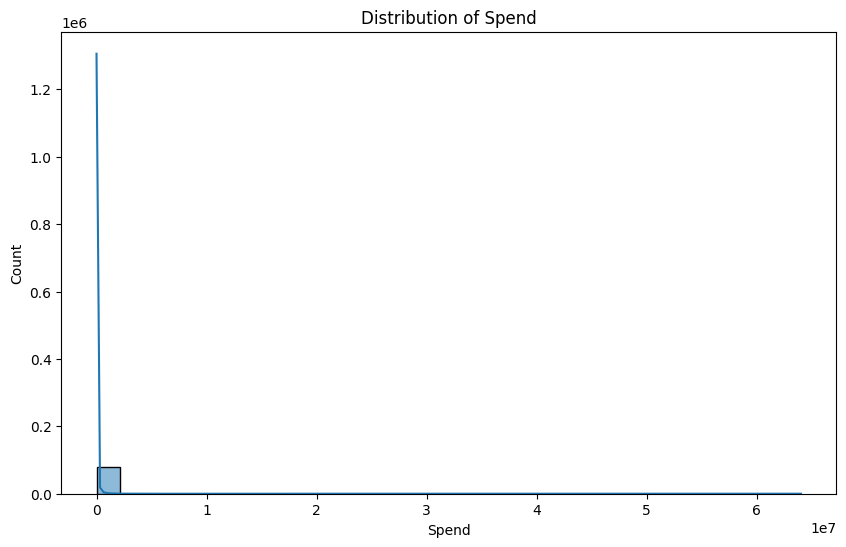


Statistical Summary for Spend:
 count    7.955000e+04
mean     5.350941e+04
std      4.040460e+05
min      0.000000e+00
25%      1.023000e+03
50%      5.291000e+03
75%      2.548000e+04
max      6.404556e+07
Name: Spend, dtype: float64

Skewness of Spend: 87.67675331065327
Kurtosis of Spend: 11522.599620705223


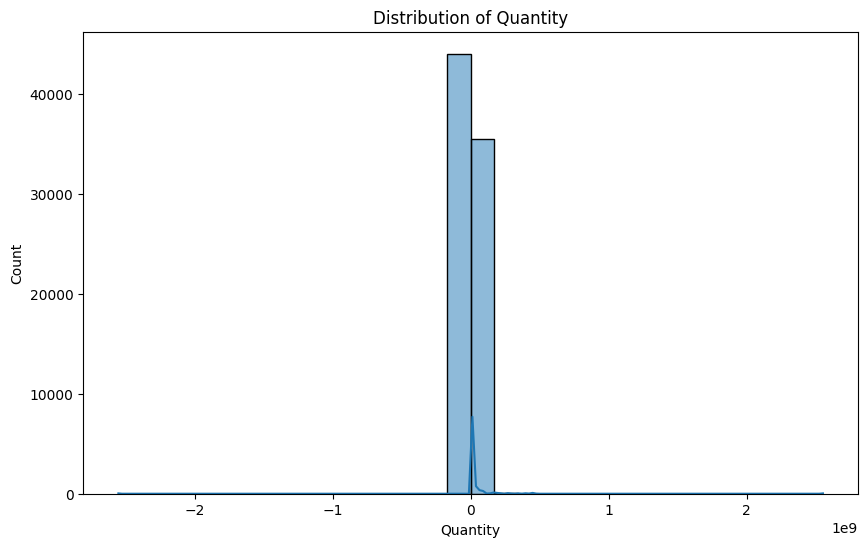


Statistical Summary for Quantity:
 count    7.955000e+04
mean     8.327865e+05
std      1.822937e+07
min     -2.552524e+09
25%      1.520250e+03
50%      1.456150e+04
75%      1.170750e+05
max      2.552568e+09
Name: Quantity, dtype: float64

Skewness of Quantity: 14.728882005913292
Kurtosis of Quantity: 10187.586475328704

Correlation Matrix:
              Spend  Quantity
Spend     1.000000  0.033298
Quantity  0.033298  1.000000


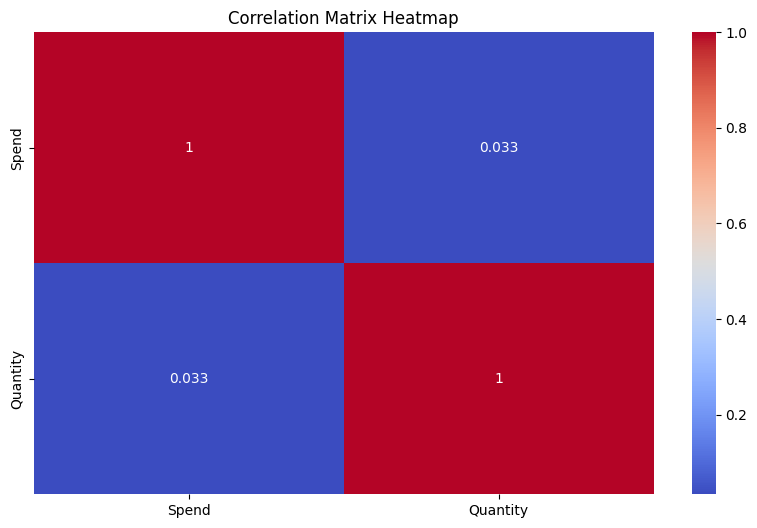

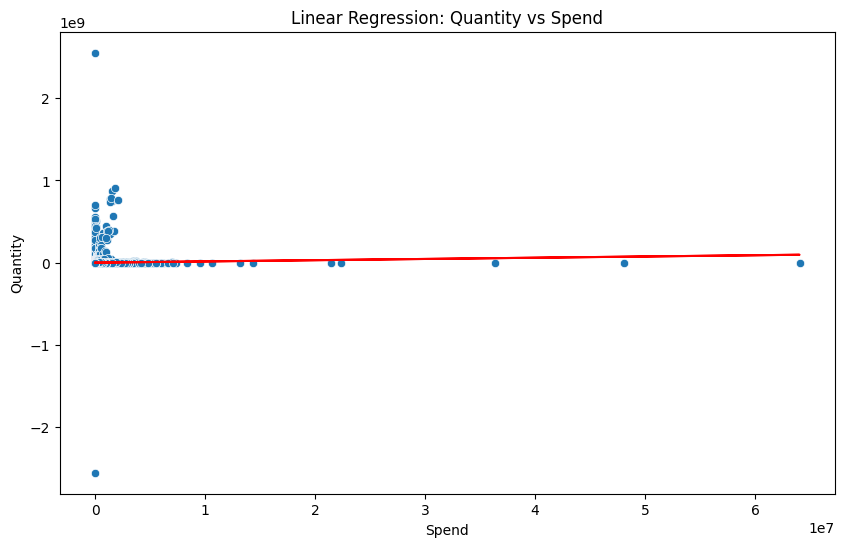


Regression Coefficient (Slope): 1.5023258056338338
Intercept: 752397.9470877966
R-squared: 0.0011087825104262317


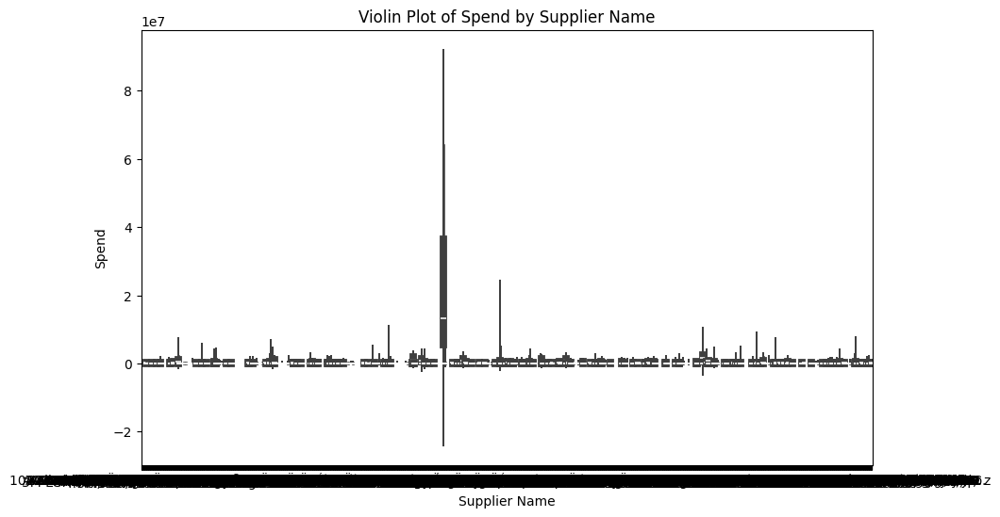

KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x7db7d8d7b130> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7db7d8d7a3b0> (for post_execute):


KeyboardInterrupt: 

In [58]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

# Load datasets
data50 = pd.read_csv('data50.csv')
book1 = pd.read_csv('Book1.csv')
data49 = pd.read_csv('data49.csv')

# Data Cleaning Function (same as before)
def clean_data(df, currency_columns=[]):
    df.columns = df.columns.str.strip()
    df.dropna(inplace=True)
    for col in currency_columns:
        df[col] = df[col].replace('[()\$,]', '', regex=True).astype(float)
        if 'Quantity' in df.columns :
          def really(x):
            return int(''.join(str(x).split(',')))
          df['Quantity'] =  df['Quantity'].apply(really)
    df.fillna(0, inplace=True)
    return df

# Clean data
data50 = clean_data(data50, currency_columns=['Spend'])
book1 = clean_data(book1)
data49 = clean_data(data49)

# Data Distribution and Statistical Summary
def data_distribution(df, column):
    plt.figure(figsize=(10, 6))
    sns.histplot(df[column], kde=True, bins=30)
    plt.title(f'Distribution of {column}')
    plt.show()

    print(f"\nStatistical Summary for {column}:\n", df[column].describe())

    # Check for skewness and kurtosis
    skewness = df[column].skew()
    kurtosis = df[column].kurtosis()
    print(f"\nSkewness of {column}: {skewness}")
    print(f"Kurtosis of {column}: {kurtosis}")

# Run Distribution Analysis for Spend in data50.csv
data_distribution(data50, 'Spend')
data_distribution(data50, 'Quantity')

# Hypothesis Testing: Are Suppliers' Spend/Quantity significantly different?
def hypothesis_test(df, group_col, test_col):
    unique_groups = df[group_col].unique()

    if len(unique_groups) > 2:
        print(f"ANOVA test for {test_col} across {group_col}")
        group_data = [df[df[group_col] == group][test_col] for group in unique_groups]
        stat, pval = stats.f_oneway(*group_data)
    else:
        print(f"T-test for {test_col} between two groups in {group_col}")
        group1 = df[df[group_col] == unique_groups[0]][test_col]
        group2 = df[df[group_col] == unique_groups[1]][test_col]
        stat, pval = stats.ttest_ind(group1, group2)

    print(f"Test Statistic: {stat}, P-value: {pval}")
    if pval < 0.05:
        print("Reject the null hypothesis: significant difference between groups.")
    else:
        print("Fail to reject the null hypothesis: no significant difference between groups.")

# # Test for differences in Spend between Suppliers in data50.csv
# hypothesis_test(data50, 'Supplier Name', 'Spend')

# # Chi-Square Test: Is there a relationship between Supplier and Defect Code in data49.csv?
# def chi_square_test(df, col1, col2):
#     contingency_table = pd.crosstab(df[col1], df[col2])
#     stat, pval, dof, expected = stats.chi2_contingency(contingency_table)
#     print(f"\nChi-Square Test between {col1} and {col2}")
#     print(f"Test Statistic: {stat}, P-value: {pval}")
#     if pval < 0.05:
#         print("Reject the null hypothesis: significant relationship between variables.")
#     else:
#         print("Fail to reject the null hypothesis: no significant relationship between variables.")

# # Chi-square test between Supplier ID and Defect Code in data49.csv
# chi_square_test(data49, 'Supplier ID', 'Defect Code')

# Correlation Matrix and Heatmap
def correlation_matrix(df, numeric_cols):
    corr_matrix = df[numeric_cols].corr()
    print("\nCorrelation Matrix:\n", corr_matrix)

    plt.figure(figsize=(10, 6))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
    plt.title("Correlation Matrix Heatmap")
    plt.show()

# Correlation matrix for data50.csv (Spend, Quantity)
correlation_matrix(data50, ['Spend', 'Quantity'])

# Linear Regression: Model relationship between Spend and Quantity in data50.csv
def linear_regression(df, x_col, y_col):
    X = df[[x_col]].values.reshape(-1, 1)
    y = df[y_col].values.reshape(-1, 1)

    reg = LinearRegression()
    reg.fit(X, y)

    # Plot regression line
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=df[x_col], y=df[y_col])
    plt.plot(df[x_col], reg.predict(X), color='red')
    plt.title(f'Linear Regression: {y_col} vs {x_col}')
    plt.show()

    print(f"\nRegression Coefficient (Slope): {reg.coef_[0][0]}")
    print(f"Intercept: {reg.intercept_[0]}")
    print(f"R-squared: {reg.score(X, y)}")

# Linear Regression between Spend and Quantity in data50.csv
linear_regression(data50, 'Spend', 'Quantity')

# Violin Plot for Distribution and Variance
def violin_plot(df, x_col, y_col):
    plt.figure(figsize=(10, 6))
    sns.violinplot(x=x_col, y=y_col, data=df)
    plt.title(f'Violin Plot of {y_col} by {x_col}')
    plt.show()

# Violin plot for Spend by Supplier Name in data50.csv
violin_plot(data50, 'Supplier Name', 'Spend')

# Pair Plot: Multivariate analysis of Spend, Quantity, and other numeric features
def pair_plot(df, numeric_cols):
    sns.pairplot(df[numeric_cols])
    plt.show()

# Pair plot for numeric columns in data50.csv
pair_plot(data50, ['Spend', 'Quantity'])

# Anomaly Detection using Isolation Forest (same as before)
def detect_anomalies(df, feature_columns):
    scaler = StandardScaler()
    X = scaler.fit_transform(df[feature_columns])

    isolation_forest = IsolationForest(contamination=0.05)
    anomalies = isolation_forest.fit_predict(X)

    df['Anomaly'] = anomalies
    anomaly_count = df['Anomaly'].value_counts()

    print("\nAnomaly Detection Results:\n", anomaly_count)
    print("\nAnomalies in Data:\n", df[df['Anomaly'] == -1])

    return df

# Detect anomalies in data50.csv based on Spend and Quantity
data50_anomalies = detect_anomalies(data50, ['Spend', 'Quantity'])

# Supplier Ranking based on Multi-Criteria Decision Analysis (same as before)
def supplier_ranking(df, criteria_columns):
    df_norm = df[criteria_columns].apply(lambda x: (x - x.min()) / (x.max() - x.min()))
    df['Score'] = df_norm.sum(axis=1)
    ranked_suppliers = df[['Supplier Name', 'Score']].sort_values(by='Score', ascending=False)
    print("\nTop 5 Ranked Suppliers:\n", ranked_suppliers.head())

# Rank suppliers in data50.csv based on Spend and Quantity
supplier_ranking(data50, ['Spend', 'Quantity'])


<ipython-input-4-76f5a19d2a43>:5: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('data50.csv')


Summary Statistics:
              Spend      Quantity
count  7.999700e+04  15783.000000
mean   1.085176e+05    244.236457
std    1.546108e+07    271.904479
min    0.000000e+00   -998.000000
25%    1.026000e+03     25.000000
50%    5.314000e+03    131.000000
75%    2.563100e+04    400.000000
max    4.371537e+09    999.000000

Total Spend: $8,681,084,903.00
Total Quantity: 3,854,784

Spend per Item:
                 PN  Spend per Item
0          K1142495             NaN
1          K1149469             NaN
2          K1149469             NaN
3          K1149472             NaN
4      FPP146-00056             NaN
...             ...             ...
79994    304D-11703        2.084000
79995    304D-11703        2.083665
79996           NaN             NaN
79997           NaN             NaN
79998           NaN             NaN

[79999 rows x 2 columns]


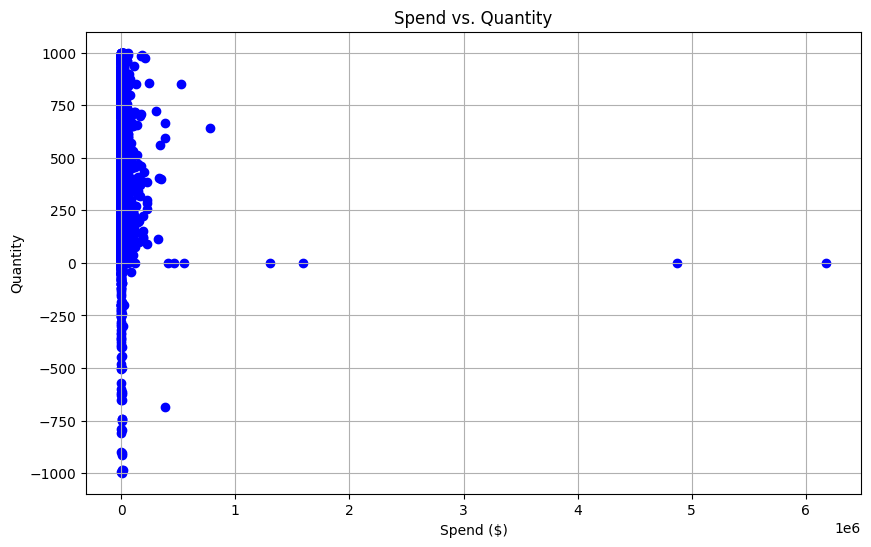


Unique Suppliers:
['- KEYA -' '101 ELECTRONIC TECHNOLOGY(HK) Co.,' '1st Mould GmbH' ...
 'ZMD Präzisionsmechanik GmbH' 'Zumbrunn Fertigungs-Center' nan]

Unique Product Owning BU:
['KSL - Kissling' 'SCR - Selective Catalytic Reduction'
 'IMS - Industrial & Medical Sensors' 'TRS - Transportation Sensors'
 'AUT - Automotive' 'HCC - Hirschmann Car Communication'
 'CIV - Industrial Commercial Transportation'
 'BCS - IND Board Connectivity & Sub Systems' 'DND - Data and Devices'
 'AND - Aerospace and Defense' 'HES - E-Mobility'
 'ASG - Application Tooling' 'IEL - IND Electrical' 'APL - Appliances'
 'ENG - Energy' 'SYS - IND Systems' 'RLY - Relay Products - Industrial'
 'PPS - IND Precision Power' 'XXX - Non-TE/Divested Products' nan]

Grouped Data:
                   Product Owning BU                        Supplier Name  \
0        AND - Aerospace and Defense  A.E. Petsche Co. Inc., An Arrow Co.   
1        AND - Aerospace and Defense                       AMULYA TRADERS   
2        AND -

<Figure size 1000x600 with 0 Axes>

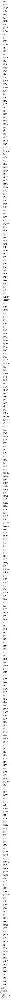

In [4]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data from CSV file
df = pd.read_csv('data50.csv')

# Convert 'Spend' column from string to float
df['Spend'] = df['Spend'].replace('[()\$,]', '', regex=True).astype(float)

# Convert 'Quantity' column to numeric
df['Quantity'] = pd.to_numeric(df['Quantity'], errors='coerce')

# Summary statistics
print("Summary Statistics:")
print(df[['Spend', 'Quantity']].describe())

# Total Spend and Total Quantity
total_spend = df['Spend'].sum()
total_quantity = df['Quantity'].sum()
print(f"\nTotal Spend: ${total_spend:,.2f}")
print(f"Total Quantity: {total_quantity:,.0f}")

# Spend per Item
df['Spend per Item'] = df['Spend'] / df['Quantity']
print("\nSpend per Item:")
print(df[['PN', 'Spend per Item']])

# Plotting Spend vs. Quantity
plt.figure(figsize=(10, 6))
plt.scatter(df['Spend'], df['Quantity'], color='blue', marker='o')
plt.title('Spend vs. Quantity')
plt.xlabel('Spend ($)')
plt.ylabel('Quantity')
plt.grid(True)
plt.show()

# Analysis of Supplier and Product Owning BU
print("\nUnique Suppliers:")
print(df['Supplier Name'].unique())

print("\nUnique Product Owning BU:")
print(df['Product Owning BU'].unique())

# Grouping and Aggregation
grouped = df.groupby(['Product Owning BU', 'Supplier Name']).agg({
    'Spend': 'sum',
    'Quantity': 'sum'
}).reset_index()
print("\nGrouped Data:")
print(grouped)

# Visualize grouped spend by Product Owning BU
plt.figure(figsize=(10, 6))
grouped.pivot(index='Product Owning BU', columns='Supplier Name', values='Spend').plot(kind='bar')
plt.title('Spend by Product Owning BU and Supplier')
plt.xlabel('Product Owning BU')
plt.ylabel('Spend ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


Correlation Matrix:
             Spend  Quantity
Spend     1.000000  0.019834
Quantity  0.019834  1.000000


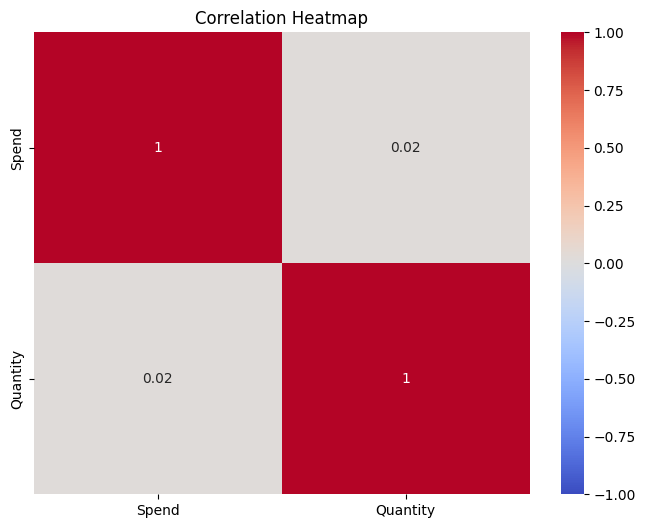

In [5]:
import seaborn as sns

# Compute correlation matrix
correlation_matrix = df[['Spend', 'Quantity']].corr()

# Print correlation matrix
print("Correlation Matrix:")
print(correlation_matrix)

# Plot correlation heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap')
plt.show()


In [2]:
import pandas as pd

# Load the data from CSV file
file_path = 'data50.csv'
df = pd.read_csv(file_path)


<ipython-input-2-75b1ede73c39>:5: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


In [3]:
df.dropna(inplace=True)

In [4]:
# Display the first few rows of the dataframe to understand its structure
print(df.head())

# Convert columns to appropriate data types
# Removing currency symbols and converting 'Spend' and 'Quantity' columns to numeric types
df['Spend'] = df['Spend'].replace('[()\$,]', '', regex=True).astype(float)
df['Quantity'] = df['Quantity'].replace({'\$': '', ',': ''}, regex=True).astype(float)

# Convert 'FY' to integer
df['FY'] = df['FY'].astype(int)

# Handle any missing values (e.g., by filling with mean or dropping)
df = df.dropna()  # Or df.fillna(method='ffill', inplace=True) depending on context


     FY                                  Supplier Label            PN  \
0  2022                            - KEYA -(0000565868)      K1142495   
1  2022                            - KEYA -(0000565868)      K1149469   
2  2024                            - KEYA -(0000565868)      K1149469   
3  2022                            - KEYA -(0000565868)      K1149472   
4  2021  101 ELECTRONIC TECHNOLOGY(HK) Co.,(0000525247)  FPP146-00056   

          Material Description Mat. Type Comm.  \
0       Cylinder lock  560047K      ZHLB    21   
1  Cylinder lock short 560231K      ZHLB    21   
2  Cylinder lock short 560231K      ZHLB    21   
3        Cylinder lock 560225K      ZHLB    21   
4      RUBBER GASKET QLS TZIRQ      ZHLB    17   

                     Product Owning BU                Invoice Plant Label  \
0                       KSL - Kissling  1257 - TEC Kissling Products GmbH   
1                       KSL - Kissling  1257 - TEC Kissling Products GmbH   
2                       KSL -

In [5]:
# Extract numerical columns for correlation analysis
numerical_df = df[['FY', 'Spend', 'Quantity']]

# Compute correlation matrix
correlation_matrix = numerical_df.corr()

print("Correlation Matrix:")
print(correlation_matrix)


Correlation Matrix:
                FY     Spend  Quantity
FY        1.000000 -0.026065 -0.014856
Spend    -0.026065  1.000000  0.033298
Quantity -0.014856  0.033298  1.000000


In [6]:
df = df.head(3000)

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Example of encoding categorical data using one-hot encoding
df_encoded = pd.get_dummies(df[['Supplier Label', 'Material Description', 'Mat. Type',
                                'Product Owning BU', 'Invoice Plant Label', 'Supplier Name',
                                'Material Label', 'Invoice Plant', 'Product Code Label',
                                'Spend Business Unit Name']], drop_first=True)

# Combine numerical and encoded categorical data for correlation analysis
df_combined = pd.concat([numerical_df, df_encoded], axis=1)

# Compute correlation matrix with encoded categorical data
correlation_matrix_combined = df_combined.corr()

print("Correlation Matrix with Encoded Categorical Data:")
print(correlation_matrix_combined)

# Visualize the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix_combined, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()


Correlation Matrix with Encoded Categorical Data:
                                                          FY     Spend  \
FY                                                  1.000000 -0.026065   
Spend                                              -0.026065  1.000000   
Quantity                                           -0.014856  0.033298   
Invoice Plant                                       0.059261 -0.056422   
Supplier Label_101 ELECTRONIC TECHNOLOGY(HK) Co... -0.031392 -0.005432   
...                                                      ...       ...   
Spend Business Unit Name_Industrial Commercial ...  0.022206 -0.050434   
Spend Business Unit Name_Kissling                   0.022177 -0.040811   
Spend Business Unit Name_Selective Catalytic Re... -0.048788 -0.014187   
Spend Business Unit Name_TE Sensors                -0.115887 -0.028496   
Spend Business Unit Name_Transportation Sensors     0.020089 -0.008463   

                                                    Quantity 

KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x7935c975b130> (for post_execute):


KeyboardInterrupt: 

<ipython-input-5-39f1c3dc7d56>:6: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('data50.csv')


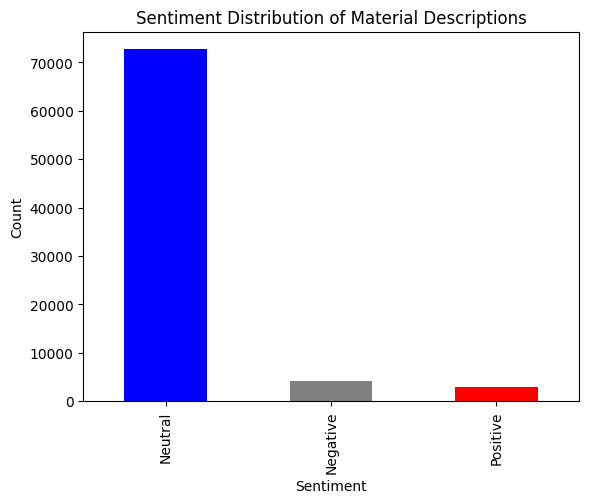

In [5]:
import pandas as pd
from textblob import TextBlob
import matplotlib.pyplot as plt

# Load the data
data = pd.read_csv('data50.csv')
# data = data.head(5000)

# Extract the Material Description column
descriptions = data['Material Description']

# Define a function to get sentiment
def get_sentiment(text):
    analysis = TextBlob(str(text))
    # Classify the sentiment as positive, neutral, or negative
    if analysis.sentiment.polarity > 0:
        return 'Positive'
    elif analysis.sentiment.polarity == 0:
        return 'Neutral'
    else:
        return 'Negative'

# Apply the function to the Material Description column
data['Sentiment'] = descriptions.apply(get_sentiment)

# Plot sentiment distribution
sentiment_counts = data['Sentiment'].value_counts()
sentiment_counts.plot(kind='bar', color=['blue', 'gray', 'red'])
plt.title('Sentiment Distribution of Material Descriptions')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.show()

# Optionally, save the results to a new CSV
data.to_csv('data50_with_sentiments.csv', index=False)


In [8]:
!ls

Book1.csv  data49.csv  data50.csv  data50_with_sentiments.csv  sample_data


In [14]:
data49 = pd.read_csv('data49.csv')

In [20]:
data49[data49.columns[8:12  bb]]

,5D Lates,5D Response FM-FY,Date Code,Responsible Building
0,NaN,2016 - 08,NaN,X0285 - Supplier - EMEA - AT_CH (AUT)
1,Late,2016 - 09,NaN,X0285 - Supplier - EMEA - AT_CH (AUT)
2,Late,2016 - 12,NaN,X0001 - Supplier Germany Automotive
3,Late,2016 - 12,NaN,X0001 - Supplier Germany Automotive
4,Late,2017 - 02,NaN,X0001 - Supplier Germany Automotive
...,...,...,...,...
13871,NaN,2024 - 02,NaN,X0003 - Supplier Hungary AUT
13872,NaN,2024 - 02,NaN,X0003 - Supplier Hungary AUT
13873,NaN,2024 - 03,NaN,X0286 - Supplier - EMEA - East (AUT)
13874,NaN,NaN,NaN,NaN


In [28]:
import pandas as pd

# Load the CSV file
df = pd.read_csv('Book1.csv')

# Display the first few rows of the dataframe
print(df.head())


   Supplier                              Name     Material  \
0    108776       JUHA KUNSTSTOFFVERARBEITUNG  1-1563642-1   
1    159185  Federal-Mogul Systems Protection  1-1564177-1   
2    159185  Federal-Mogul Systems Protection  1-1564178-1   
3    159185  Federal-Mogul Systems Protection  1-1564719-1   
4    108061              HellermannTyton GmbH  1-1670194-1   

                           Desc             commodity Final Level   
0       COVER,FOR CABLE CHANNEL     Molded Parts, Tpl       Level2  
1  INSULATION TUBE,GES 40 10-12     Molded Parts, Tpl       Level1  
2  INSULATION TUBE,GES 40 20-12  Extruded Tubes/Plugs       Level1  
3   INSULATION TUBE,GES 40 6-12  Extrusion-Tplas-Cmcl       Level1  
4                CABLE FIXATION     Molded Parts, Tpl       Level3  


In [22]:
# Basic info
print(df.info())

# Summary statistics
print(df.describe(include='all'))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1305 entries, 0 to 1304
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Supplier      1305 non-null   int64 
 1   Name          1305 non-null   object
 2   Material      1305 non-null   object
 3   Desc          1305 non-null   object
 4   commodity     1303 non-null   object
 5   Final Level   1305 non-null   object
dtypes: int64(1), object(5)
memory usage: 61.3+ KB
None
             Supplier                             Name  Material  \
count     1305.000000                             1305      1305   
unique            NaN                              109      1302   
top               NaN  Rosenberger Hochfrequenztechnik  737955-5   
freq              NaN                              103         2   
mean    266934.836015                              NaN       NaN   
std     181495.256366                              NaN       NaN   
min     101694.000000     

In [23]:
# Check for missing values
print(df.isnull().sum())

# Drop rows with missing critical data if necessary
df = df.dropna()


Supplier        0
Name            0
Material        0
Desc            0
commodity       2
Final Level     0
dtype: int64


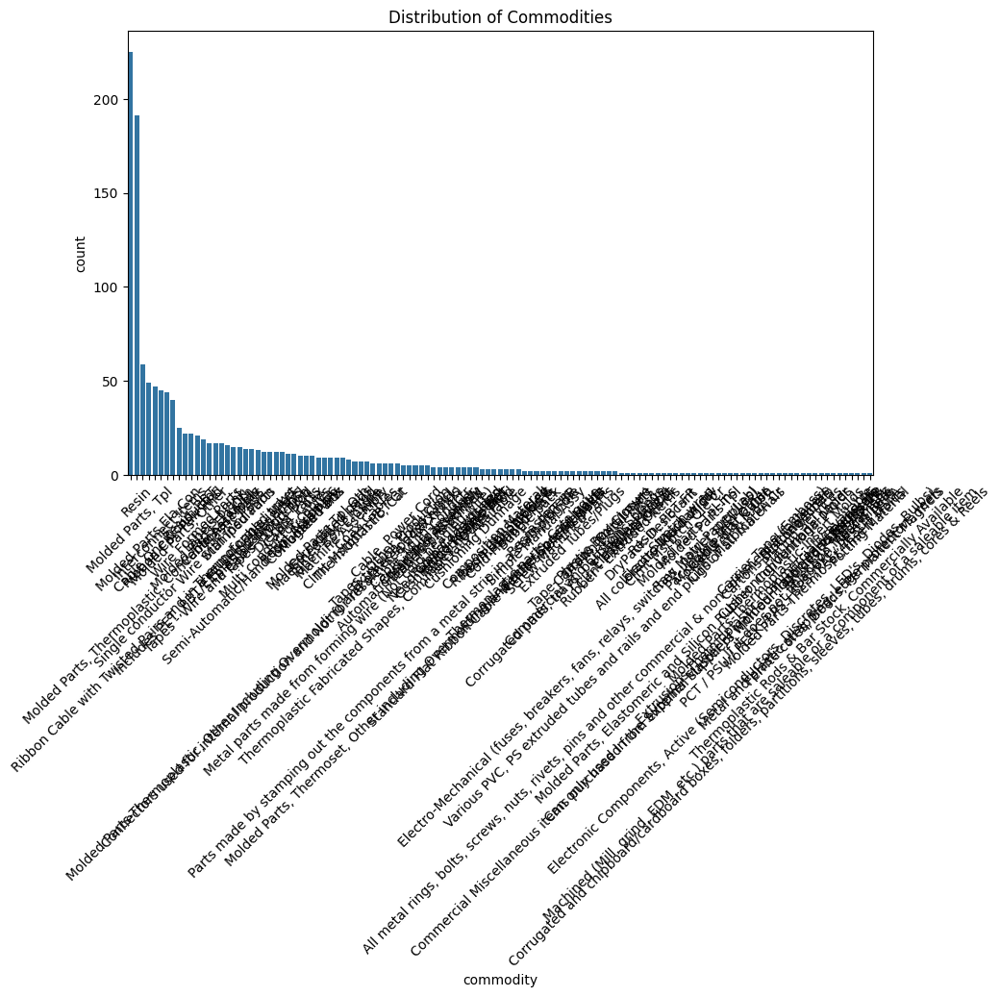

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns

# Countplot for commodity distribution
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='commodity', order=df['commodity'].value_counts().index)
plt.title('Distribution of Commodities')
plt.xticks(rotation=45)
plt.show()


In [39]:
df.head()

,Supplier,Name,Material,Desc,commodity,Final Level
0,108776,JUHA KUNSTSTOFFVERARBEITUNG,1-1563642-1,"COVER,FOR CABLE CHANNEL","Molded Parts, Tpl",Level2
1,159185,Federal-Mogul Systems Protection,1-1564177-1,"INSULATION TUBE,GES 40 10-12","Molded Parts, Tpl",Level1
2,159185,Federal-Mogul Systems Protection,1-1564178-1,"INSULATION TUBE,GES 40 20-12",Extruded Tubes/Plugs,Level1
3,159185,Federal-Mogul Systems Protection,1-1564719-1,"INSULATION TUBE,GES 40 6-12",Extrusion-Tplas-Cmcl,Level1
4,108061,HellermannTyton GmbH,1-1670194-1,CABLE FIXATION,"Molded Parts, Tpl",Level3


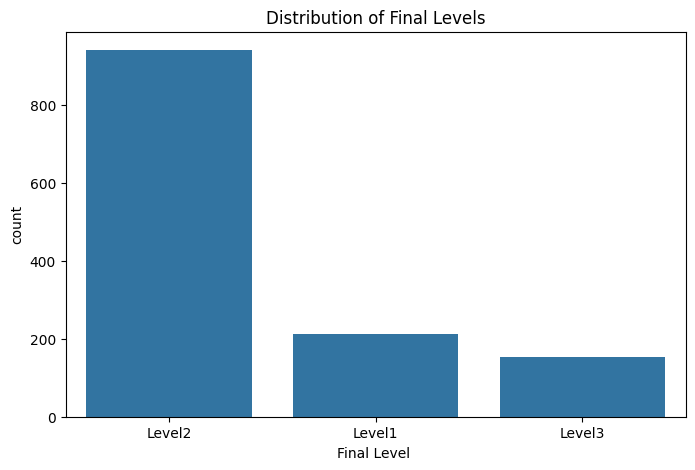

In [33]:
plt.figure(figsize=(8, 5))
sns.countplot(data=df, x='Final Level ', order=df['Final Level '].value_counts().index)
plt.title('Distribution of Final Levels')
plt.show()


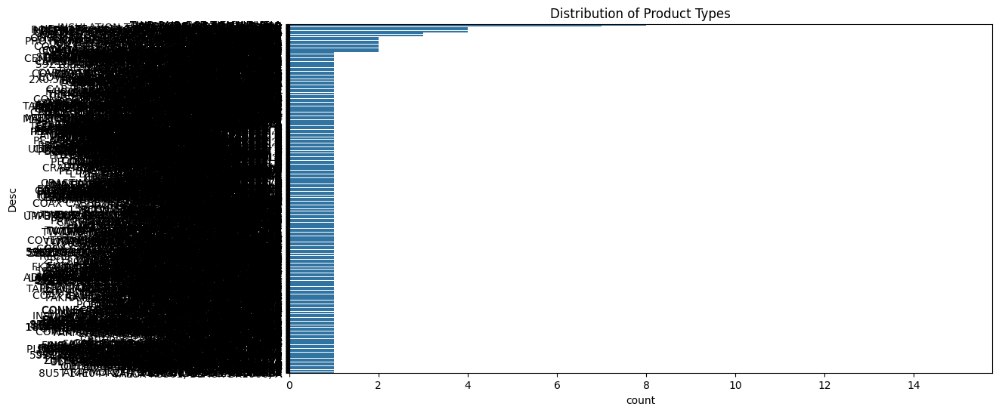

In [34]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df, y='Desc', order=df['Desc'].value_counts().index)
plt.title('Distribution of Product Types')
plt.show()


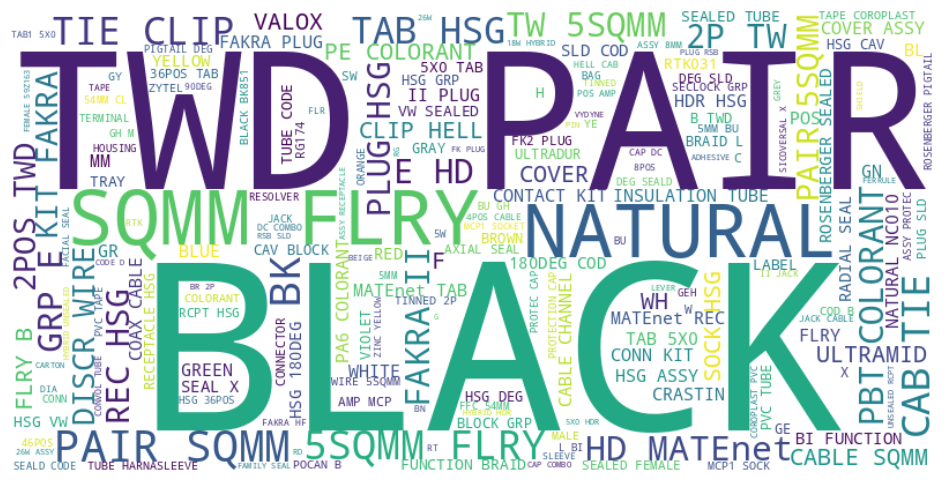

In [35]:
from wordcloud import WordCloud

# Join all descriptions into a single string
text = ' '.join(df['Desc'].astype(str))

# Generate a word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Display the word cloud
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


In [36]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Vectorize the product descriptions
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(df['Desc'])


In [38]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

# Define features and labels
y = df['Final Level ']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train the classifier
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Predict and evaluate
y_pred = model.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[ 25  27   0]
 [  0 279   2]
 [  1  37  21]]
              precision    recall  f1-score   support

      Level1       0.96      0.48      0.64        52
      Level2       0.81      0.99      0.89       281
      Level3       0.91      0.36      0.51        59

    accuracy                           0.83       392
   macro avg       0.90      0.61      0.68       392
weighted avg       0.85      0.83      0.80       392



In [40]:
bby_test

,Final Level
1172,Level2
514,Level2
843,Level1
977,Level2
1168,Level2
...,...
636,Level2
462,Level2
806,Level2
990,Level2


In [51]:
import pandas as pd

# Load the data
df = pd.read_csv('Book1.csv')

# Inspect the first few rows and unique values in 'commodity' and 'Desc'
print(df.head())
print(df['commodity'].unique().size)
print(df['Desc'].unique().size)


   Supplier                              Name     Material  \
0    108776       JUHA KUNSTSTOFFVERARBEITUNG  1-1563642-1   
1    159185  Federal-Mogul Systems Protection  1-1564177-1   
2    159185  Federal-Mogul Systems Protection  1-1564178-1   
3    159185  Federal-Mogul Systems Protection  1-1564719-1   
4    108061              HellermannTyton GmbH  1-1670194-1   

                           Desc             commodity Final Level   
0       COVER,FOR CABLE CHANNEL     Molded Parts, Tpl       Level2  
1  INSULATION TUBE,GES 40 10-12     Molded Parts, Tpl       Level1  
2  INSULATION TUBE,GES 40 20-12  Extruded Tubes/Plugs       Level1  
3   INSULATION TUBE,GES 40 6-12  Extrusion-Tplas-Cmcl       Level1  
4                CABLE FIXATION     Molded Parts, Tpl       Level3  
124
1104


In [52]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
import numpy as np

# Combine 'commodity' and 'Desc' into a single text column for analysis
df['text'] = df['commodity'].fillna('') + ' ' + df['Desc'].fillna('')

# Clean text data
def preprocess_text(text):
    # Convert to lowercase
    text = text.lower()
    # Remove special characters, numbers, etc.
    text = ''.join(e for e in text if e.isalpha() or e.isspace())
    return text

df['text'] = df['text'].apply(preprocess_text)


In [53]:
# Vectorize text using TF-IDF
vectorizer = TfidfVectorizer(stop_words='english', max_features=1000)
X = vectorizer.fit_transform(df['text'])


In [54]:
from sklearn.cluster import KMeans

# Number of clusters (can be tuned)
num_clusters = 10
kmeans = KMeans(n_clusters=num_clusters, random_state=0)
df['Cluster'] = kmeans.fit_predict(X)

# Show cluster centroids
centroids = kmeans.cluster_centers_
print(centroids)


[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.00321991 0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.0011212  0.00118547 ... 0.00112447 0.00155296 0.        ]
 [0.         0.         0.         ... 0.         0.         0.03395499]
 [0.         0.         0.         ... 0.         0.         0.        ]]


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [55]:
# Show samples from each cluster
for i in range(num_clusters):
    print(f"Cluster {i}:")
    print(df[df['Cluster'] == i].head(), "\n")


Cluster 0:
     Supplier          Name     Material  \
25     159933  CABLENA S.A.   1-956278-8   
72     159933  CABLENA S.A.  2-2323232-3   
211    159933  CABLENA S.A.  1-2323232-8   
212    159933  CABLENA S.A.  1-2323233-0   
213    159933  CABLENA S.A.  1-2323233-1   

                                     Desc             commodity Final Level   \
25   TWD PAIR,0.35 SQMM,FLRY-A,GREY-BLACK  Ribbon Cbl  Pair Rnd       Level3   
72      2P,TW,0.5SQMM,FLRY-A,WS/SW,TINNED  Ribbon Cbl  Pair Rnd       Level3   
211     2P,TW,0.5SQMM,FLRY-A,VI/BR,TINNED  Ribbon Cbl  Pair Rnd       Level3   
212            2P,TW,0.5SQMM,FLRY-A,GR/SW  Ribbon Cbl  Pair Rnd       Level3   
213            2P,TW,0.5SQMM,FLRY-A,GE/BR  Ribbon Cbl  Pair Rnd       Level3   

                                                 text  Cluster  
25   ribbon cbl  pair rnd twd pair sqmmflryagreyblack        0  
72        ribbon cbl  pair rnd ptwsqmmflryawsswtinned        0  
211       ribbon cbl  pair rnd ptwsqmmflryavibrt

In [57]:
from sklearn.feature_extraction.text import TfidfVectorizer
import regex as re
# Combine 'commodity' and 'Desc' into a single text column
df['text'] = df['commodity'].fillna('') + ' ' + df['Desc'].fillna('')

# Preprocess text data
def preprocess_text(text):
    text = text.lower()  # Convert to lowercase
    text = re.sub(r'\d+', '', text)  # Remove numbers
    text = re.sub(r'\W+', ' ', text)  # Remove special characters
    text = text.strip()  # Remove leading and trailing whitespace
    return text

df['text'] = df['text'].apply(preprocess_text)

# Vectorize text using TF-IDF
vectorizer = TfidfVectorizer(stop_words='english', max_features=3000)  # Increase features for better representation
X = vectorizer.fit_transform(df['text'])


In [58]:
from sklearn.cluster import KMeans

# Number of clusters (adjust as needed)
num_clusters = 50  # Start with a higher number, tune as needed
kmeans = KMeans(n_clusters=num_clusters, random_state=0, n_init=10)
df['Cluster'] = kmeans.fit_predict(X)


In [60]:
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np

# Get top terms for each cluster
def get_top_terms(cluster_centers, feature_names, top_n=10):
    top_terms = []
    for i in range(cluster_centers.shape[0]):
        terms_idx = cluster_centers[i].argsort()[-top_n:]
        terms = [feature_names[idx] for idx in terms_idx]
        top_terms.append(terms)
    return top_terms

# Get top terms from the vectorizer
feature_names = vectorizer.get_feature_names_out()
top_terms = get_top_terms(kmeans.cluster_centers_, feature_names)
for i, terms in enumerate(top_terms):
    print(f"Cluster {i} top terms: {terms}")


Cluster 0 top terms: ['red', 'rd', 'nfx', 'bk', 'dr', 'vx', 'black', 'natural', 'resin', 'valox']
Cluster 1 top terms: ['leavyseal', 'protec', 'cover', 'mm', 'parts', 'molded', 'hsg', 'tpl', 'pos', 'tab']
Cluster 2 top terms: ['schwar', 'blau', 'ge', 'brn', 'flry', 'litze', 'mm', 'cable', 'flr', 'conductor']
Cluster 3 top terms: ['flry', 'sqmm', 'pair', 'ribbon', 'twd', 'jacket', 'twisted', 'round', 'pairs', 'cable']
Cluster 4 top terms: ['jack', 'parts', 'stamped', 'kit', 'ii', 'contact', 'shell', 'plug', 'diecast', 'fakra']
Cluster 5 top terms: ['rsb', 'rtk', 'rg', 'fakra', 'conn', 'sld', 'plug', 'items', 'interconnect', 'kit']
Cluster 6 top terms: ['signal', 'colorbatch', 'gf', 'red', 'anjacom', 'blue', 'yellow', 'resin', 'colorant', 'pa']
Cluster 7 top terms: ['uncolored', 'sg', 'ls', 'hs', 'pbt', 'natural', 'black', 'resin', 'bg', 'ultradur']
Cluster 8 top terms: ['mm', 'bk', 'tube', 'pvc', 'assy', 'parts', 'molded', 'thermoplastic', 'molds', 'conventional']
Cluster 9 top terms: [

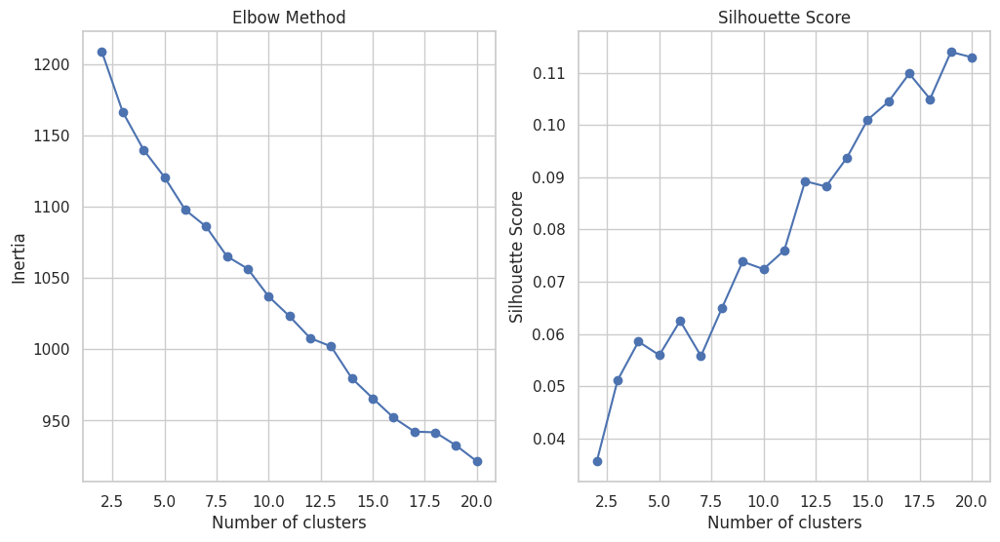

In [62]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Compute the Elbow Method
inertia = []
silhouette_avg = []

for n_clusters in range(2, 21):  # Test from 2 to 20 clusters
    kmeans = KMeans(n_clusters=n_clusters, random_state=0, n_init=10)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)
    cluster_labels = kmeans.labels_
    silhouette_avg.append(silhouette_score(X, cluster_labels))

# Plot Elbow Method
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(range(2, 21), inertia, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method')

# Plot Silhouette Score
plt.subplot(1, 2, 2)
plt.plot(range(2, 21), silhouette_avg, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score')
plt.show()


In [63]:
# Optimal number of clusters (for example, let's assume 5 from the plots)
optimal_clusters = 5
kmeans = KMeans(n_clusters=optimal_clusters, random_state=0, n_init=10)
df['Cluster'] = kmeans.fit_predict(X)


In [64]:
import numpy as np

# Function to get top terms from each cluster
def get_top_terms(cluster_centers, feature_names, top_n=10):
    top_terms = []
    for i in range(cluster_centers.shape[0]):
        terms_idx = cluster_centers[i].argsort()[-top_n:]
        terms = [feature_names[idx] for idx in terms_idx]
        top_terms.append(terms)
    return top_terms

# Get top terms from the vectorizer
feature_names = vectorizer.get_feature_names_out()
top_terms = get_top_terms(kmeans.cluster_centers_, feature_names)
for i, terms in enumerate(top_terms):
    print(f"Cluster {i} top terms: {terms}")


Cluster 0 top terms: ['mm', 'insulation', 'single', 'discr', 'coax', 'flry', 'sqmm', 'wire', 'conductor', 'cable']
Cluster 1 top terms: ['pe', 'bg', 'valox', 'ultradur', 'pa', 'black', 'natural', 'colorant', 'pbt', 'resin']
Cluster 2 top terms: ['fakra', 'plug', 'mm', 'conventional', 'seal', 'molds', 'ela', 'thermoplastic', 'molded', 'parts']
Cluster 3 top terms: ['twisted', 'round', 'rnd', 'pairs', 'cable', 'ribbon', 'twd', 'flry', 'sqmm', 'pair']
Cluster 4 top terms: ['grp', 'hd', 'matenet', 'mcp', 'pos', 'tab', 'hsg', 'parts', 'molded', 'tpl']


In [65]:
from collections import Counter

def generate_cluster_names(df, cluster_col, text_col, top_n=5):
    cluster_names = {}

    for cluster in df[cluster_col].unique():
        cluster_texts = df[df[cluster_col] == cluster][text_col]
        all_text = ' '.join(cluster_texts)
        word_counts = Counter(all_text.split())
        most_common_words = [word for word, _ in word_counts.most_common(top_n)]
        cluster_names[cluster] = ' '.join(most_common_words)

    return cluster_names

# Generate cluster names
cluster_names = generate_cluster_names(df, 'Cluster', 'text')
for cluster, name in cluster_names.items():
    print(f"Cluster {cluster}: {name}")


Cluster 4: molded parts tpl hsg pos
Cluster 2: parts molded thermoplastic x molds
Cluster 3: pair a sqmm flry cable
Cluster 0: cable wire conductor sqmm one
Cluster 1: a resin pbt colorant black


In [66]:
df['Category_Name'] = df['Cluster'].map(cluster_names)


In [68]:
df.Category_Name.unique()

array(['molded parts tpl hsg pos', 'parts molded thermoplastic x molds',
       'pair a sqmm flry cable', 'cable wire conductor sqmm one',
       'a resin pbt colorant black'], dtype=object)

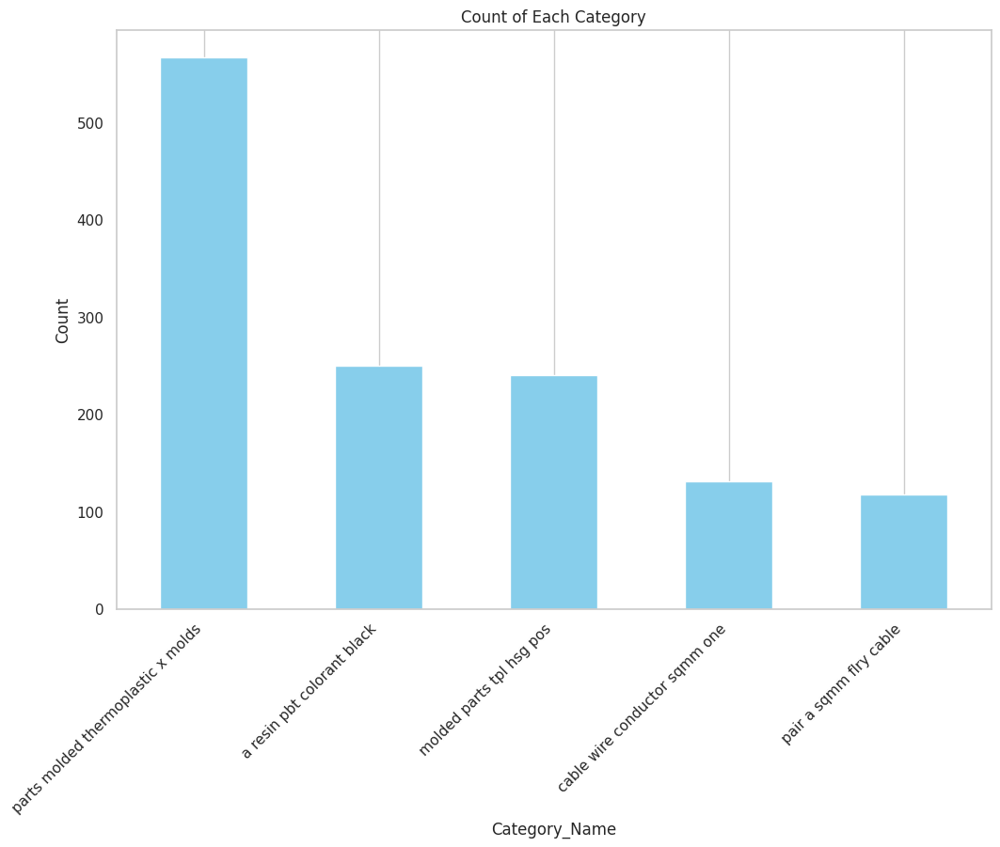

In [69]:
import matplotlib.pyplot as plt

# Plot the distribution of categories
category_counts = df['Category_Name'].value_counts()

plt.figure(figsize=(12, 8))
category_counts.plot(kind='bar', color='skyblue')
plt.title('Count of Each Category')
plt.xlabel('Category_Name')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y')
plt.show()


In [70]:
category_counts = df['Category_Name'].value_counts()
print("Number of items per category:")
print(category_counts)


Number of items per category:
Category_Name
parts molded thermoplastic x molds    567
a resin pbt colorant black            250
molded parts tpl hsg pos              240
cable wire conductor sqmm one         131
pair a sqmm flry cable                117
Name: count, dtype: int64


In [72]:
category_summary = df.groupby('Category_Name')['Final Level '].value_counts().unstack(fill_value=0)
print("Summary statistics per category:")
print(category_summary)



Summary statistics per category:
Final Level                         Level1  Level2  Level3
Category_Name                                             
a resin pbt colorant black              11     238       1
cable wire conductor sqmm one           15      81      35
molded parts tpl hsg pos                14     192      34
pair a sqmm flry cable                   0      56      61
parts molded thermoplastic x molds     172     374      21


In [73]:
supplier_counts = df.groupby('Category_Name')['Supplier'].nunique()
print("Unique suppliers per category:")
print(supplier_counts)


Unique suppliers per category:
Category_Name
a resin pbt colorant black            19
cable wire conductor sqmm one         18
molded parts tpl hsg pos              27
pair a sqmm flry cable                 6
parts molded thermoplastic x molds    78
Name: Supplier, dtype: int64


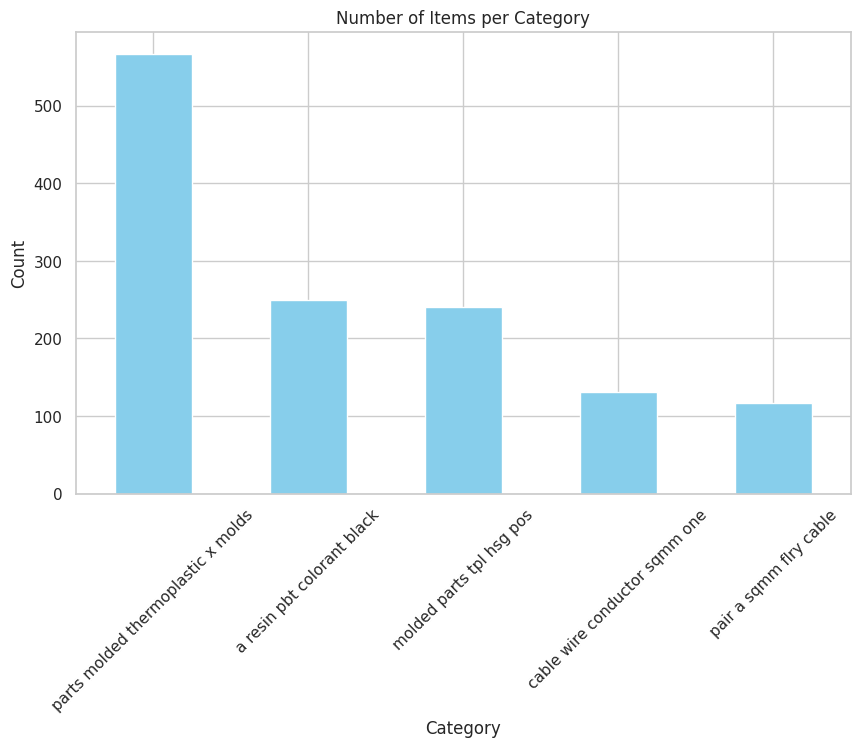

In [74]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
category_counts.plot(kind='bar', color='skyblue')
plt.title('Number of Items per Category')
plt.xlabel('Category')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


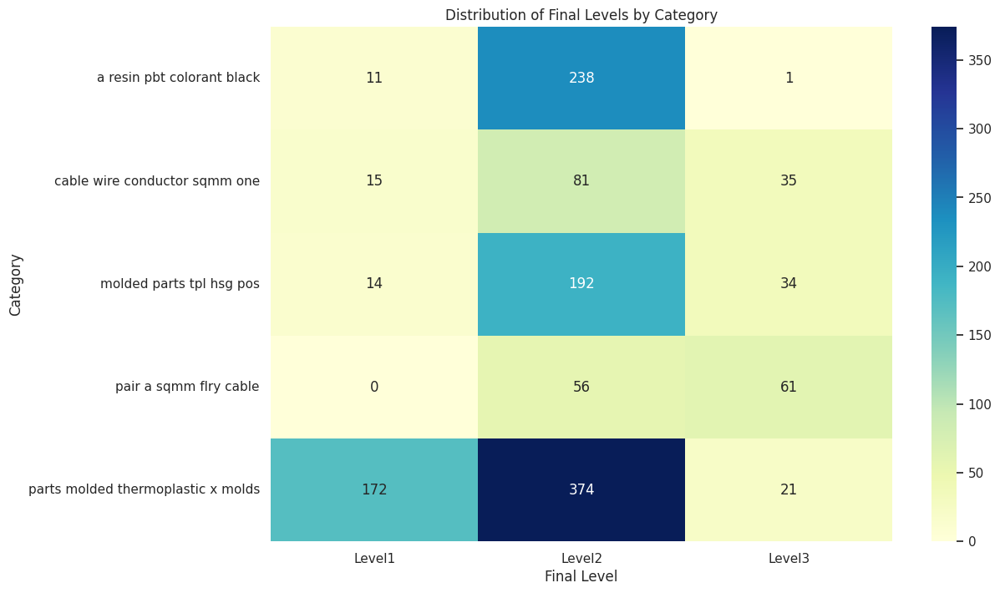

In [75]:
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.heatmap(category_summary, annot=True, cmap='YlGnBu', fmt='d')
plt.title('Distribution of Final Levels by Category')
plt.xlabel('Final Level')
plt.ylabel('Category')
plt.show()


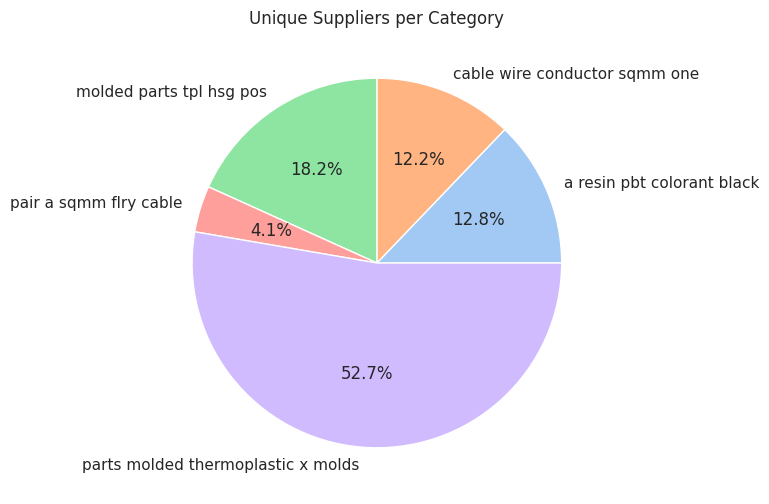

In [76]:
plt.figure(figsize=(10, 6))
supplier_counts.plot(kind='pie', autopct='%1.1f%%', colors=sns.color_palette('pastel'))
plt.title('Unique Suppliers per Category')
plt.ylabel('')
plt.show()


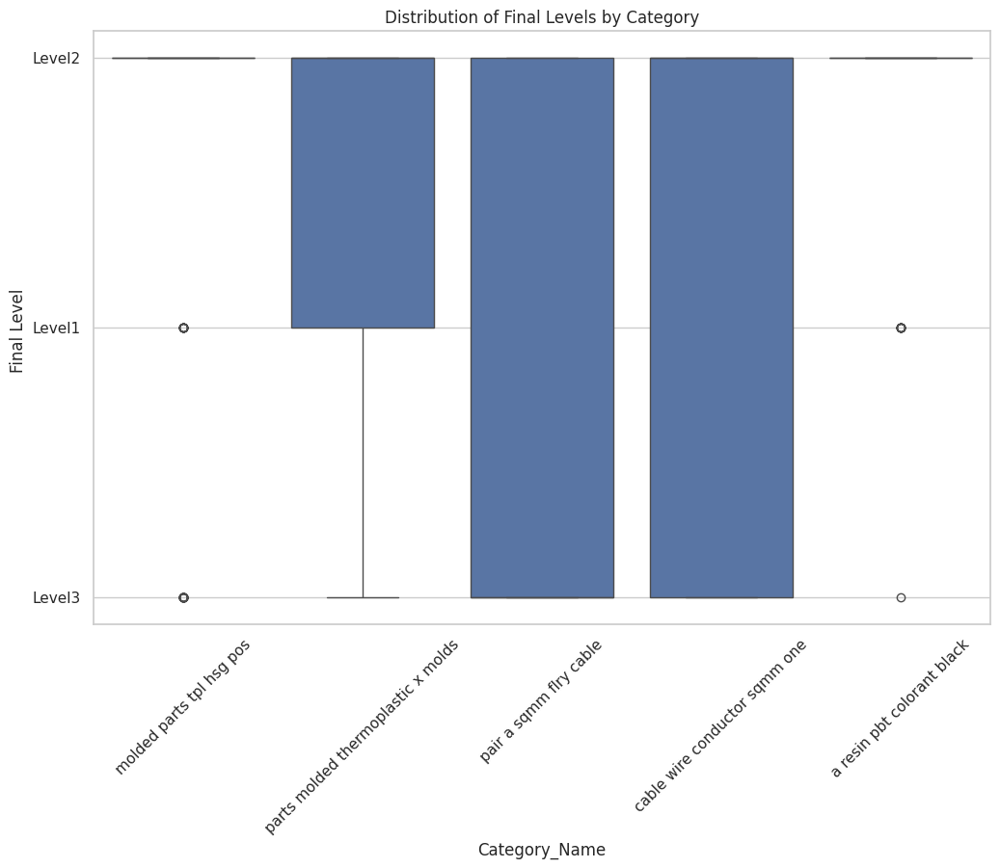

In [78]:
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.boxplot(data=df, x='Category_Name', y='Final Level ', order=df['Category_Name'].unique())
plt.title('Distribution of Final Levels by Category')
plt.xticks(rotation=45)
plt.show()


In [81]:
df.head()

,Supplier,Name,Material,Desc,commodity,Final Level,text,Cluster,Category_Name
0,108776,JUHA KUNSTSTOFFVERARBEITUNG,1-1563642-1,"COVER,FOR CABLE CHANNEL","Molded Parts, Tpl",Level2,molded parts tpl cover for cable channel,4,molded parts tpl hsg pos
1,159185,Federal-Mogul Systems Protection,1-1564177-1,"INSULATION TUBE,GES 40 10-12","Molded Parts, Tpl",Level1,molded parts tpl insulation tube ges,4,molded parts tpl hsg pos
2,159185,Federal-Mogul Systems Protection,1-1564178-1,"INSULATION TUBE,GES 40 20-12",Extruded Tubes/Plugs,Level1,extruded tubes plugs insulation tube ges,2,parts molded thermoplastic x molds
3,159185,Federal-Mogul Systems Protection,1-1564719-1,"INSULATION TUBE,GES 40 6-12",Extrusion-Tplas-Cmcl,Level1,extrusion tplas cmcl insulation tube ges,2,parts molded thermoplastic x molds
4,108061,HellermannTyton GmbH,1-1670194-1,CABLE FIXATION,"Molded Parts, Tpl",Level3,molded parts tpl cable fixation,4,molded parts tpl hsg pos


from matplotlib import pyplot as plt
_df_0['Supplier'].plot(kind='hist', bins=20, title='Supplier')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['Cluster'].plot(kind='hist', bins=20, title='Cluster')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_2.groupby('Name').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_3.groupby('Material').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_4.groupby('Desc').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_5.groupby('commodity').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_6.plot(kind='scatter', x='Supplier', y='Cluster', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_7['Supplier'].plot(kind='line', figsize=(8, 4), title='Supplier')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_8['Cluster'].plot(kind='line', figsize=(8, 4), title='Cluster')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Material'].value_counts()
    for x_label, grp in _df_9.groupby('Name')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Name')
_ = plt.ylabel('Material')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Desc'].value_counts()
    for x_label, grp in _df_10.groupby('Material')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Material')
_ = plt.ylabel('Desc')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['commodity'].value_counts()
    for x_label, grp in _df_11.groupby('Desc')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Desc')
_ = plt.ylabel('commodity')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Final Level '].value_counts()
    for x_label, grp in _df_12.groupby('commodity')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('commodity')
_ = plt.ylabel('Final Level ')

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_13['Name'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_13, x='Supplier', y='Name', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_14['Material'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_14, x='Supplier', y='Material', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_15['Desc'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_15, x='Supplier', y='Desc', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_16['commodity'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_16, x='Supplier', y='commodity', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [92]:
import pandas as pd

# Load the CSV file
df = pd.read_csv('data49.csv')

# Display the first few rows of the dataframe
print(df.head())

# Display summary information about the dataframe
print(df.info())

# Display basic statistics for numerical columns
print(df.describe())


  Request #   Action #  Supplier ID                            Supplier  \
0   1325811  1329843.0     113823.0                VIENNAPLEX FABRIK F.   
1   1326520  1330839.0     465967.0                          ELMET GmbH   
2   1338181  1346310.0     366235.0                      Variotech GmbH   
3   1340171  1349028.0     107985.0  HÄRTER Stanztechnik GmbH & Co. KGa   
4   1348984  1360750.0     106854.0               ENAYATI GMBH & Co. KG   

            Key Contact            Defect Code  3D Time  5D Time 5D Lates  \
0  EG002067 - EWALD Uhl     05 - Non-Fill/Void     3.34    15.61      NaN   
1  EG002067 - EWALD Uhl  03 - Broken/Fractured    27.55    27.55     Late   
2  EG002067 - EWALD Uhl         01 - Dimension    20.02    20.18     Late   
3  EG002067 - EWALD Uhl       24 - Mixed Parts     1.17    18.21     Late   
4  EG002067 - EWALD Uhl    20 - Identification     1.47    11.27     Late   

  5D Response FM-FY  ...                  Major Commodity Code  \
0         2016 - 08 

In [83]:
# Sample IDs
ids = df['Material'].unique()
print(ids)
# Check the length and format of IDs
id_lengths = [len(id) for id in ids]
print("ID Lengths:")
print(pd.Series(id_lengths).value_counts())

# Check for unique prefixes or patterns
id_prefixes = [id.split('-')[0] for id in ids]
print("ID Prefixes:")
print(pd.Series(id_prefixes).value_counts())


['1-1563642-1' '1-1564177-1' '1-1564178-1' ... '9-704618-2'
 'CR025911-0225-I' 'CR029011-0294-I']
ID Lengths:
9     675
8     261
11    219
10    127
7      12
15      4
12      2
13      1
18      1
Name: count, dtype: int64
ID Prefixes:
1           180
2            75
3            31
5            21
4            19
           ... 
1719391       1
1719246       1
1719242       1
1719191       1
CR029011      1
Name: count, Length: 628, dtype: int64


In [93]:
import pandas as pd

# Load the CSV file
df = pd.read_csv('data49.csv')

# Display the first few rows of the dataframe
print(df.head())

# Display summary information about the dataframe
print(df.info())

# Display basic statistics for numerical columns
print(df.describe())


  Request #   Action #  Supplier ID                            Supplier  \
0   1325811  1329843.0     113823.0                VIENNAPLEX FABRIK F.   
1   1326520  1330839.0     465967.0                          ELMET GmbH   
2   1338181  1346310.0     366235.0                      Variotech GmbH   
3   1340171  1349028.0     107985.0  HÄRTER Stanztechnik GmbH & Co. KGa   
4   1348984  1360750.0     106854.0               ENAYATI GMBH & Co. KG   

            Key Contact            Defect Code  3D Time  5D Time 5D Lates  \
0  EG002067 - EWALD Uhl     05 - Non-Fill/Void     3.34    15.61      NaN   
1  EG002067 - EWALD Uhl  03 - Broken/Fractured    27.55    27.55     Late   
2  EG002067 - EWALD Uhl         01 - Dimension    20.02    20.18     Late   
3  EG002067 - EWALD Uhl       24 - Mixed Parts     1.17    18.21     Late   
4  EG002067 - EWALD Uhl    20 - Identification     1.47    11.27     Late   

  5D Response FM-FY  ...                  Major Commodity Code  \
0         2016 - 08 

In [95]:
# Check for missing values
print(df.isnull().sum())

# Drop rows with missing critical columns if necessary
df = df.dropna(subset=['Defect Code'])

# Convert date columns to datetime
df['Request Entry Date'] = pd.to_datetime(df['Request Entry Date'], errors='coerce')


Request #                               1
Action #                                2
Supplier ID                          2434
Supplier                             2434
Key Contact                             2
Defect Code                             3
3D Time                                 2
5D Time                                 2
5D Lates                             9844
5D Response FM-FY                       2
Date Code                           10780
Responsible Building                    2
TE Part Number                          3
Part Desc                               3
SC Status                            4480
CBC = Product owning BU               181
Complaint Source Definition          2962
Delivery Plant - Ship Point Code    13873
Major Commodity Code                 2605
Purchasing Commodity Code               3
Key Contact Building                   51
PN Major Conn                           3
Product Code                            5
Request Status                    

<ipython-input-95-0f97b6316cbd>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Request Entry Date'] = pd.to_datetime(df['Request Entry Date'], errors='coerce')


In [96]:
# Count the number of occurrences of each DefectCode
defect_code_counts = df['Defect Code'].value_counts()

# Calculate the mean 3D Time and 5D Time for each DefectCode
defect_code_times = df.groupby('Defect Code')[['3D Time', '5D Time']].mean()

# Display the results
print(defect_code_counts)
print(defect_code_times)


Defect Code
18 - Nonconforming Operation                          1562
04 - Excess Material                                  1458
01 - Dimension                                        1425
03 - Broken/Fractured                                 1311
02 - Bent/Mis-form                                    1222
05 - Non-Fill/Void                                    1097
06 - Contamination                                     635
20 - Identification                                    594
23 - Incorrect Part                                    559
10 - Components Missing/Misplaced                      541
24 - Mixed Parts                                       411
12 - Adhesion/Delamination                             371
13 - Color, Discoloration                              347
08 - Electrical/Electro-Optical                        341
21 - Packaging                                         299
07 - Workmanship                                       274
09 - Mechanical/Electro-Mechanical          

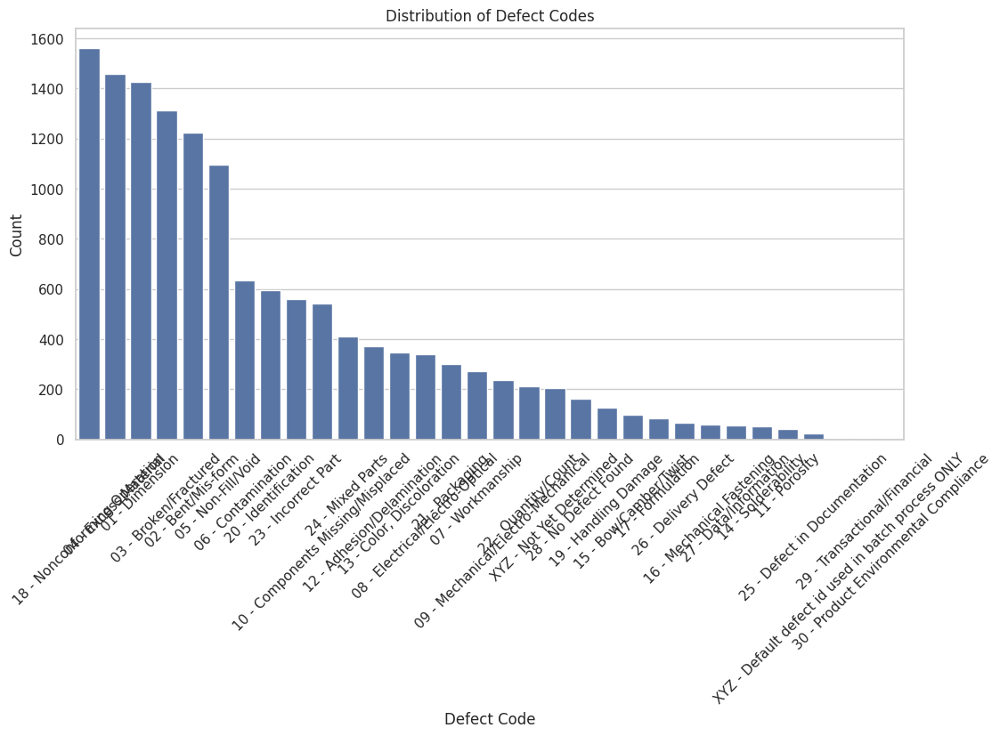

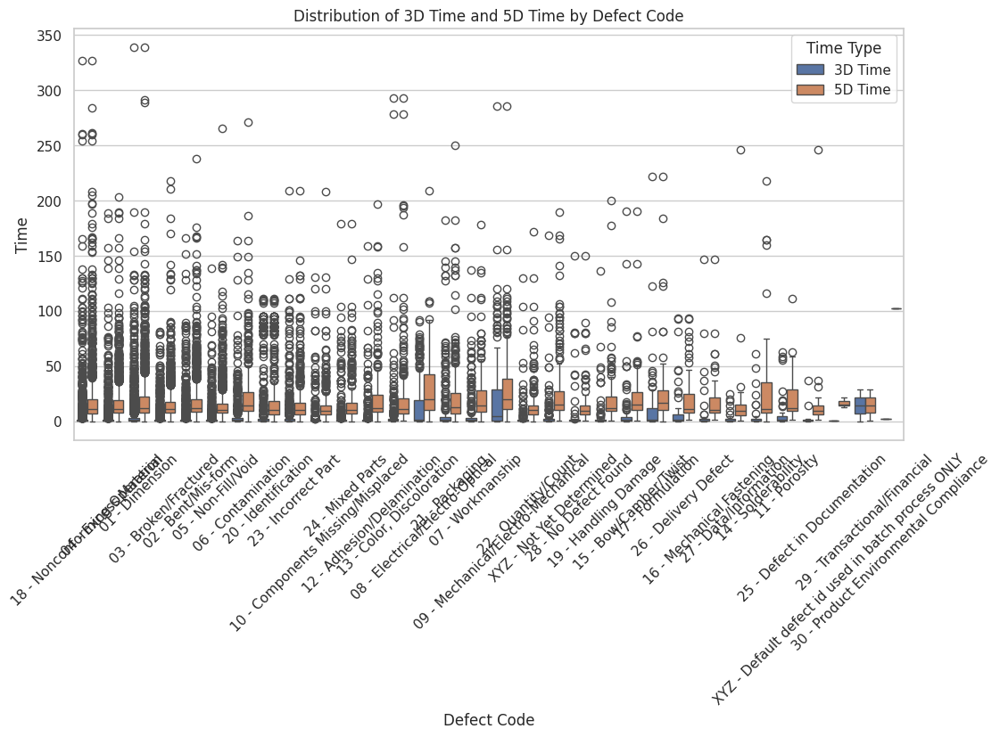

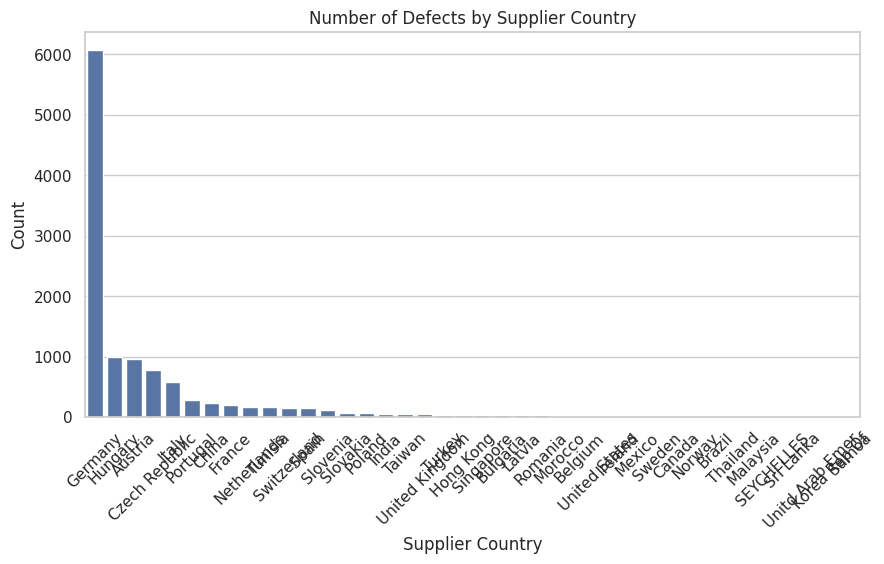

In [97]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style of the visualizations
sns.set(style="whitegrid")

# Plot the distribution of defect codes
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='Defect Code', order=df['Defect Code'].value_counts().index)
plt.xticks(rotation=45)
plt.title('Distribution of Defect Codes')
plt.xlabel('Defect Code')
plt.ylabel('Count')
plt.show()

# Plot the average 3D Time and 5D Time by Defect Code
plt.figure(figsize=(12, 6))
df_melted = df.melt(id_vars='Defect Code', value_vars=['3D Time', '5D Time'], var_name='TimeType', value_name='Time')
sns.boxplot(data=df_melted, x='Defect Code', y='Time', hue='TimeType', order=df['Defect bCode'].value_counts().index)
plt.xticks(rotation=45)
plt.title('Distribution of 3D Time and 5D Time by Defect Code')
plt.xlabel('Defect Code')
plt.ylabel('Time')
plt.legend(title='Time Type')
plt.show()

# Plot the count of defects per Supplier Country
plt.figure(figsize=(10, 5))
sns.countplot(data=df, x='Supplier Country', order=df['Supplier Country'].value_counts().index)
plt.xticks(rotation=45)
plt.title('Number of Defects by Supplier Country')
plt.xlabel('Supplier Country')
plt.ylabel('Count')
plt.show()


In [98]:
# Overall statistics for the dataset
print("Overall statistics:")
print(df.describe(include='all'))

# Summary of defect codes
print("Summary of defect codes:")
print(defect_code_counts)

# Summary of average times for each defect code
print("Average times by defect code:")
print(defect_code_times)


Overall statistics:
       Request #      Action #    Supplier ID                  Supplier  \
count      13873  1.387300e+04   11441.000000                     11441   
unique     13867           NaN            NaN                       683   
top      1514880           NaN            NaN  STARLIM  Spritzguss GmbH   
freq           2           NaN            NaN                       363   
mean         NaN  1.510864e+06  279348.521196                       NaN   
min          NaN  1.306350e+06    1186.000000                       NaN   
25%          NaN  1.413633e+06  113186.000000                       NaN   
50%          NaN  1.495982e+06  170040.000000                       NaN   
75%          NaN  1.609353e+06  457864.000000                       NaN   
max          NaN  1.729499e+06  581382.000000                       NaN   
std          NaN  1.159034e+05  172854.328203                       NaN   

                  Key Contact                   Defect Code      3D Time  \
cou

<ipython-input-116-c7d7b58c119c>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=defect_code_counts.index, y=defect_code_counts.values, palette='viridis')


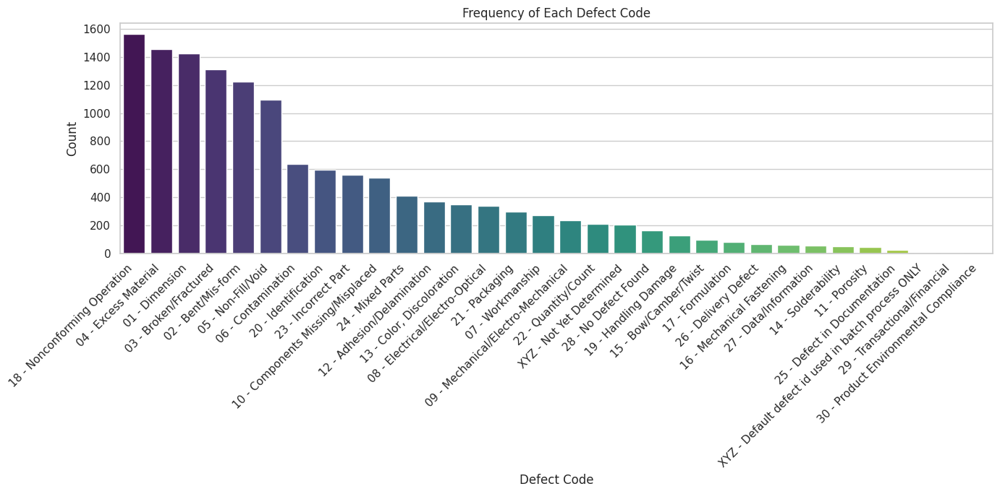

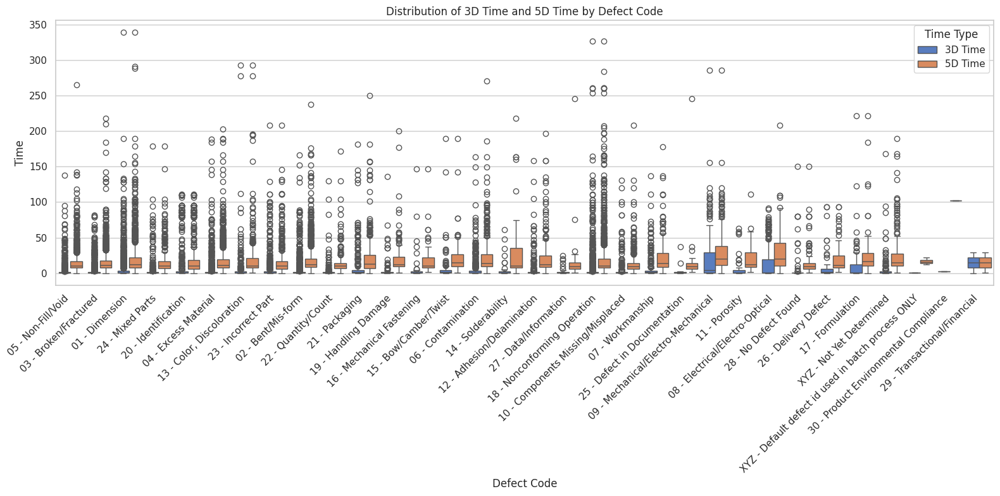

TypeError: DataFrame.pivot() takes 1 positional argument but 4 were given

<Figure size 1200x1000 with 0 Axes>

In [116]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the CSV file
df = pd.read_csv('data49.csv')

# Clean and Prepare Data
df = df.dropna(subset=['Defect Code'])
df['Request Entry Date'] = pd.to_datetime(df['Request Entry Date'], errors='coerce')

# Set the style of the visualizations
sns.set(style="whitegrid")

# 1. Bar Plot of Defect Code Frequencies
plt.figure(figsize=(14, 7))
defect_code_counts = df['Defect Code'].value_counts()
sns.barplot(x=defect_code_counts.index, y=defect_code_counts.values, palette='viridis')
plt.xticks(rotation=45, ha='right')
plt.title('Frequency of Each Defect Code')
plt.xlabel('Defect Code')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

# 2. Box Plot for 3D and 5D Time by Defect Code
plt.figure(figsize=(16, 8))
df_melted = df.melt(id_vars='Defect Code', value_vars=['3D Time', '5D Time'], var_name='TimeType', value_name='Time')
sns.boxplot(data=df_melted, x='Defect Code', y='Time', hue='TimeType', palette='muted')
plt.xticks(rotation=45, ha='right')
plt.title('Distribution of 3D Time and 5D Time by Defect Code')
plt.xlabel('Defect Code')
plt.ylabel('Time')
plt.legend(title='Time Type')
plt.tight_layout()
plt.show()

# 3. Heatmap of Average Times by Defect Code
plt.figure(figsize=(12, 10))
defect_code_times = df.groupby('Defect Code')[['3D Time', '5D Time']].mean().reset_index()
defect_code_times = defect_code_times.pivot('Defect Code', 'TimeType', '3D Time')  # Adjust based on your DataFrame structure
sns.heatmap(defect_code_times, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Heatmap of Average Times by Defect Code')
plt.xlabel('Time Type')
plt.ylabel('Defect Code')
plt.show()

# 4. Time Series Analysis of Defects Over Time
plt.figure(figsize=(14, 7))
df['Month'] = df['Request Entry Date'].dt.to_period('M')
monthly_defects = df.groupby('Month').size()
sns.lineplot(x=monthly_defects.index.astype(str), y=monthly_defects.values, marker='o')
plt.xticks(rotation=45)
plt.title('Monthly Number of Defects')
plt.xlabel('Month')
plt.ylabel('Number of Defects')
plt.tight_layout()
plt.show()

# 5. Defect Code Distribution by Supplier Country
plt.figure(figsize=(14, 7))
sns.countplot(data=df, x='Supplier Country', hue='Defect Code', palette='Set2')
plt.xticks(rotation=45, ha='right')
plt.title('Defect Code Distribution by Supplier Country')
plt.xlabel('Supplier Country')
plt.ylabel('Count')
plt.legend(title='Defect Code', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [118]:
defect_code_times

,AverageTime_3D Time,AverageTime_5D Time
Defect Code,,
01 - Dimension,6.540175,20.385004
02 - Bent/Mis-form,4.591113,18.722398
03 - Broken/Fractured,3.212845,16.263158
04 - Excess Material,4.071790,17.125391
05 - Non-Fill/Void,3.017630,15.555989
06 - Contamination,5.573307,21.057496
07 - Workmanship,7.546423,21.720876
08 - Electrical/Electro-Optical,12.727009,28.620821
09 - Mechanical/Electro-Mechanical,20.672152,30.202405


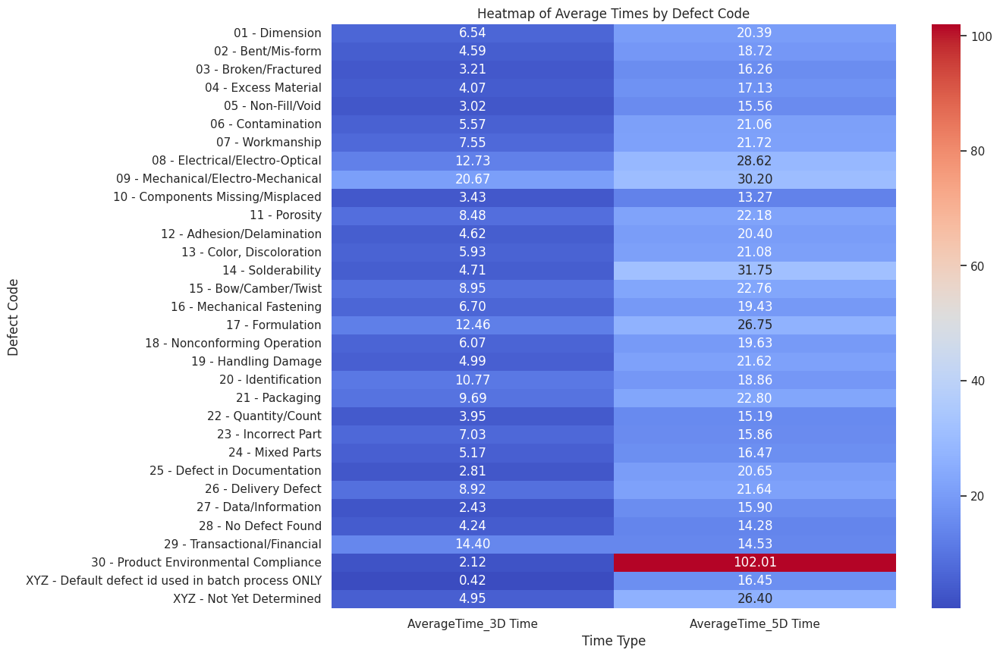

In [117]:

# 3. Heatmap of Average Times by Defect Code
plt.figure(figsize=(12, 10))
# Pivot table to aggregate average times
defect_code_times = defect_code_times_melted.pivot_table(index='Defect Code', columns='TimeType', values=['AverageTime'], aggfunc='mean')

# Since we have a multi-level column index, we need to flatten it
defect_code_times.columns = [f'{i}_{j}' for i, j in defect_code_times.columns]

# Plot heatmap
sns.heatmap(defect_code_times, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Heatmap of Average Times by Defect Code')
plt.xlabel('Time Type')
plt.ylabel('Defect Code')
plt.show()


In [112]:
defect_code_times_melted

,Defect Code,TimeType,AverageTime
0,01 - Dimension,3D Time,6.540175
1,02 - Bent/Mis-form,3D Time,4.591113
2,03 - Broken/Fractured,3D Time,3.212845
3,04 - Excess Material,3D Time,4.071790
4,05 - Non-Fill/Void,3D Time,3.017630
...,...,...,...
59,28 - No Defect Found,5D Time,14.277578
60,29 - Transactional/Financial,5D Time,14.525000
61,30 - Product Environmental Compliance,5D Time,102.010000
62,XYZ - Default defect id used in batch process ...,5D Time,16.446667


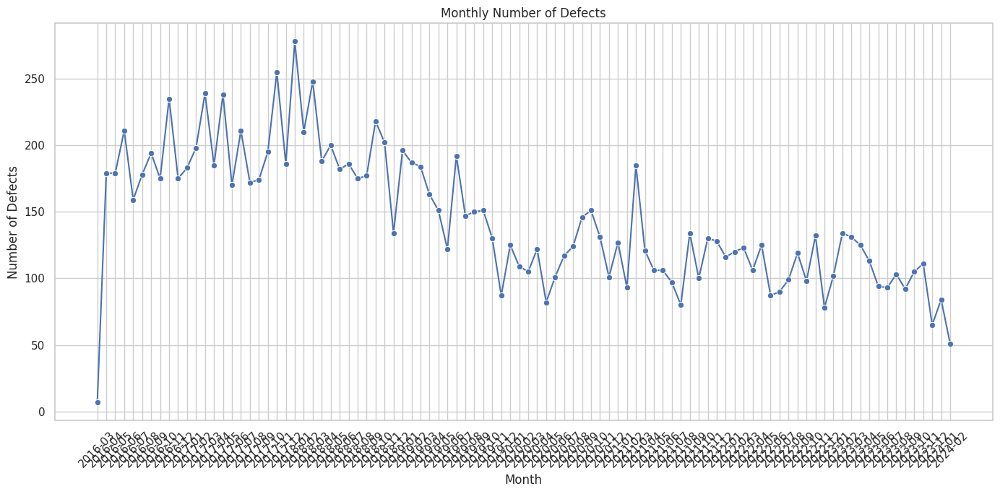

In [120]:


# 4. Time Series Analysis of Defects Over Time
plt.figure(figsize=(14, 7))
df['Month'] = df['Request Entry Date'].dt.to_period('M')
monthly_defects = df.groupby('Month').size()
sns.lineplot(x=monthly_defects.index.astype(str), y=monthly_defects.values, marker='o')
plt.xticks(rotation=45)
plt.title('Monthly Number of Defects')
plt.xlabel('Month')
plt.ylabel('Number of Defects')
plt.tight_layout()
plt.show()



In [125]:
df.columns

Index(['Request #', 'Action #', 'Supplier ID', 'Supplier', 'Key Contact',
       'Defect Code', '3D Time', '5D Time', '5D Lates', '5D Response FM-FY',
       'Date Code', 'Responsible Building', 'TE Part Number', 'Part Desc',
       'SC Status', 'CBC = Product owning BU', 'Complaint Source Definition',
       'Delivery Plant - Ship Point Code', 'Major Commodity Code',
       'Purchasing Commodity Code', 'Key Contact Building', 'PN Major Conn',
       'Product Code', 'Request Status', 'Request Entry Date',
       'Responsible Description', 'Supplier Country', 'Defect Process',
       'Month'],
      dtype='object')

f

<ipython-input-128-b6b9bbbc02e1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=defect_code_counts.index, y=defect_code_counts.values, palette='viridis')


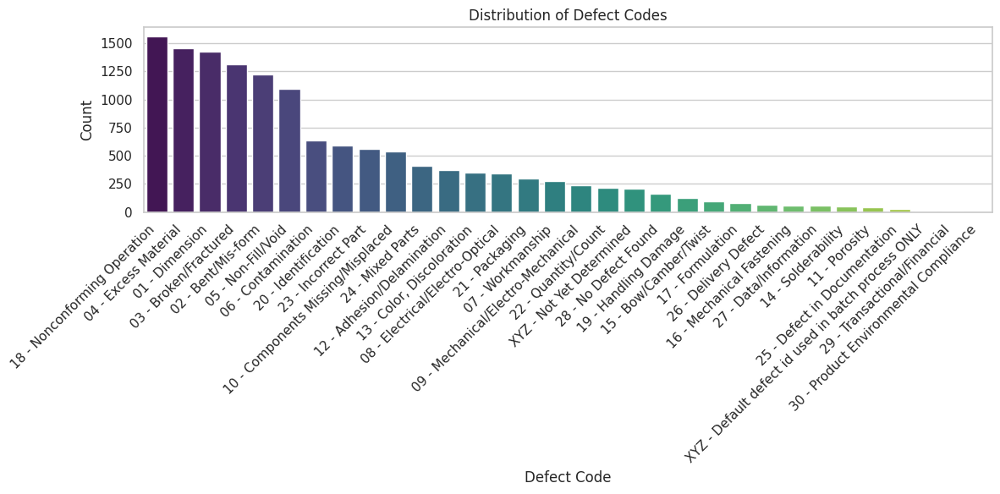

In [128]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count the occurrences of each DefectCode
defect_code_counts = df['Defect Code'].value_counts()

# Plot the distribution of DefectCodes
plt.figure(figsize=(12, 6))
sns.barplot(x=defect_code_counts.index, y=defect_code_counts.values, palette='viridis')
plt.xticks(rotation=45, ha='right')
plt.title('Distribution of Defect Codes')
plt.xlabel('Defect Code')
plt.ylabel('Count')
plt.tight_layout()
plt.show()


<ipython-input-129-a8221664341f>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Defect Code', y='3D Time', data=time_stats, palette='Blues', label='3D Time')
<ipython-input-129-a8221664341f>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Defect Code', y='5D Time', data=time_stats, palette='Reds', label='5D Time')
<ipython-input-129-a8221664341f>:13: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


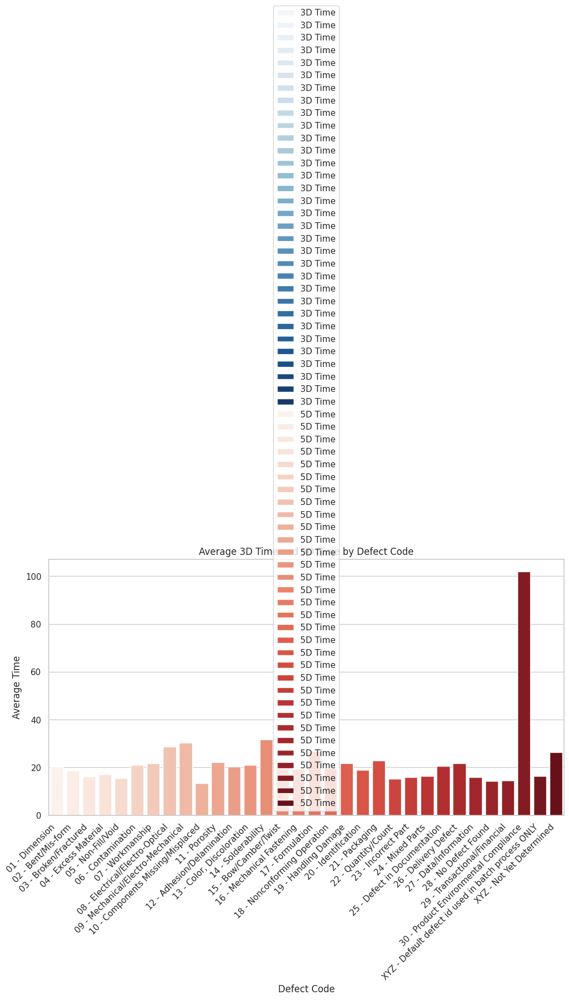

In [129]:
# Group by DefectCode and calculate average times
time_stats = df.groupby('Defect Code')[['3D Time', '5D Time']].mean().reset_index()

# Plot average times by DefectCode
plt.figure(figsize=(12, 6))
sns.barplot(x='Defect Code', y='3D Time', data=time_stats, palette='Blues', label='3D Time')
sns.barplot(x='Defect Code', y='5D Time', data=time_stats, palette='Reds', label='5D Time')
plt.xticks(rotation=45, ha='right')
plt.title('Average 3D Time and 5D Time by Defect Code')
plt.xlabel('Defect Code')
plt.ylabel('Average Time')
plt.legend()
plt.tight_layout()
plt.show()


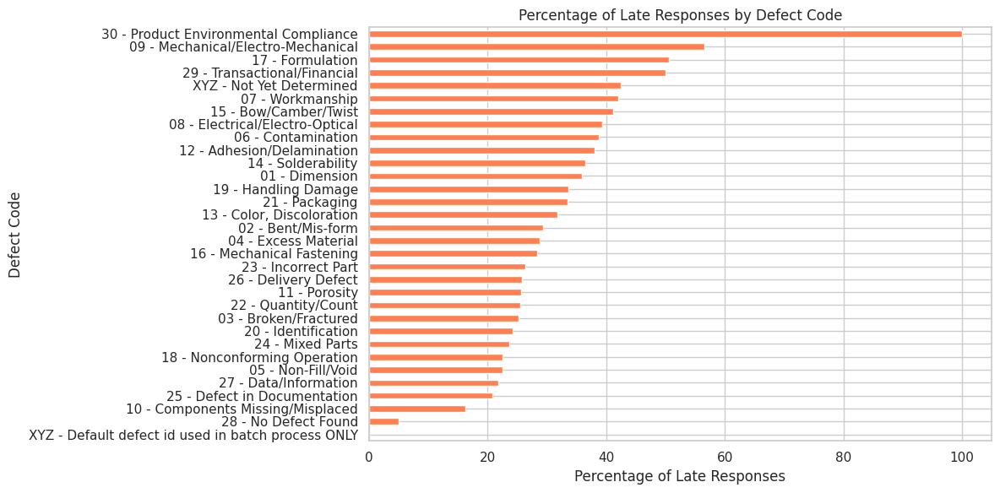

In [130]:
# Convert '5D Lates' to binary for analysis
df['5D Lates'] = df['5D Lates'].apply(lambda x: 1 if x == 'Late' else 0)

# Calculate the percentage of late responses by DefectCode
late_percentage = df.groupby('Defect Code')['5D Lates'].mean() * 100

# Plot the percentage of late responses
plt.figure(figsize=(12, 6))
late_percentage.sort_values().plot(kind='barh', color='coral')
plt.title('Percentage of Late Responses by Defect Code')
plt.xlabel('Percentage of Late Responses')
plt.ylabel('Defect Code')
plt.tight_layout()
plt.show()


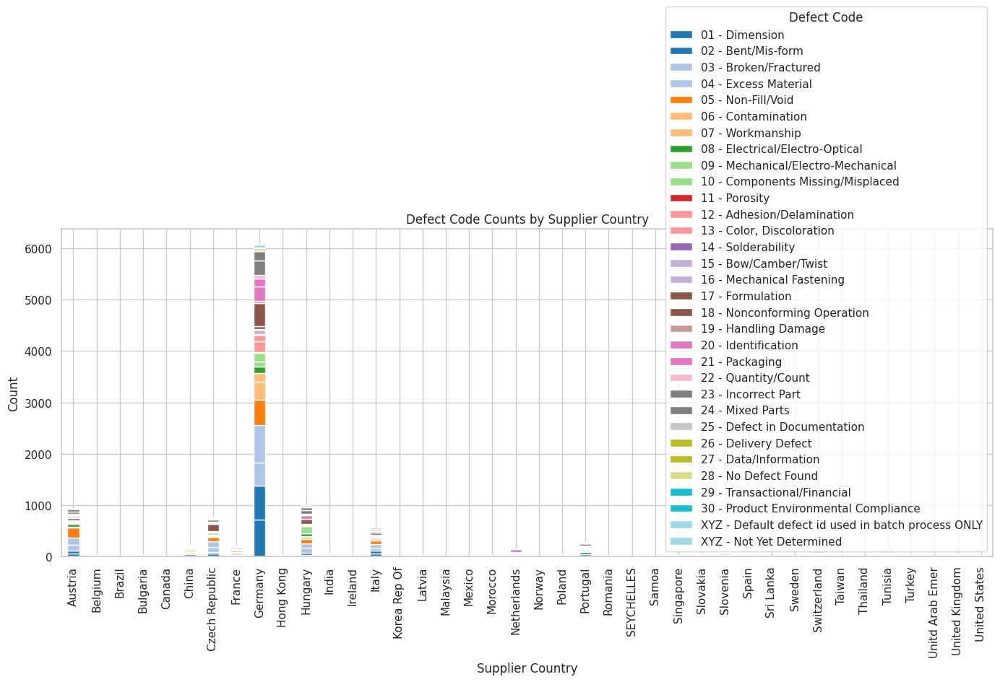

In [131]:
# Count of each DefectCode by Supplier Country
defect_by_country = df.groupby(['Supplier Country', 'Defect Code']).size().unstack().fillna(0)

# Plot the defect counts by country
defect_by_country.plot(kind='bar', stacked=True, figsize=(14, 8), colormap='tab20')
plt.title('Defect Code Counts by Supplier Country')
plt.xlabel('Supplier Country')
plt.ylabel('Count')
plt.legend(title='Defect Code')
plt.tight_layout()
plt.show()


In [136]:
df['5D Lates'].dtypes

dtype('int64')

In [138]:
df.columns

Index(['Request #', 'Action #', 'Supplier ID', 'Supplier', 'Key Contact',
       'Defect Code', '3D Time', '5D Time', '5D Lates', '5D Response FM-FY',
       'Date Code', 'Responsible Building', 'TE Part Number', 'Part Desc',
       'SC Status', 'CBC = Product owning BU', 'Complaint Source Definition',
       'Delivery Plant - Ship Point Code', 'Major Commodity Code',
       'Purchasing Commodity Code', 'Key Contact Building', 'PN Major Conn',
       'Product Code', 'Request Status', 'Request Entry Date',
       'Responsible Description', 'Supplier Country', 'Defect Process',
       'Month'],
      dtype='object')

<ipython-input-151-1bef8e7344f6>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=defect_process_counts.index, y=defect_process_counts.values, palette='pastel')


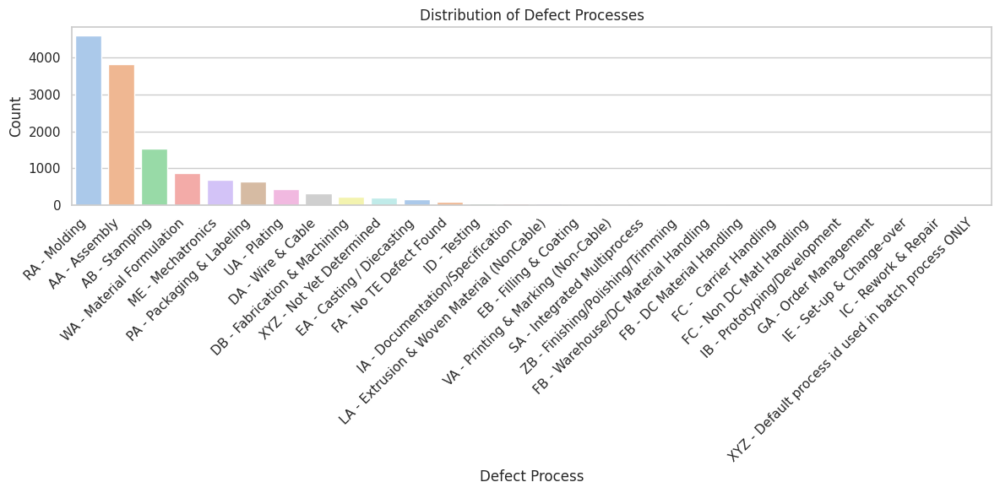

In [151]:
# Count occurrences of each Defect Process
defect_process_counts = df['Defect Process'].value_counts()

# Plot the distribution of Defect Processes
plt.figure(figsize=(12, 6))
sns.barplot(x=defect_process_counts.index, y=defect_process_counts.values, palette='pastel')
plt.xticks(rotation=45, ha='right')
plt.title('Distribution of Defect Processes')
plt.xlabel('Defect Process')
plt.ylabel('Count')
plt.tight_layout()
plt.show()


<ipython-input-150-fb4babb6ccc5>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=country_defects.index, y=country_defects.values, palette='tab10')


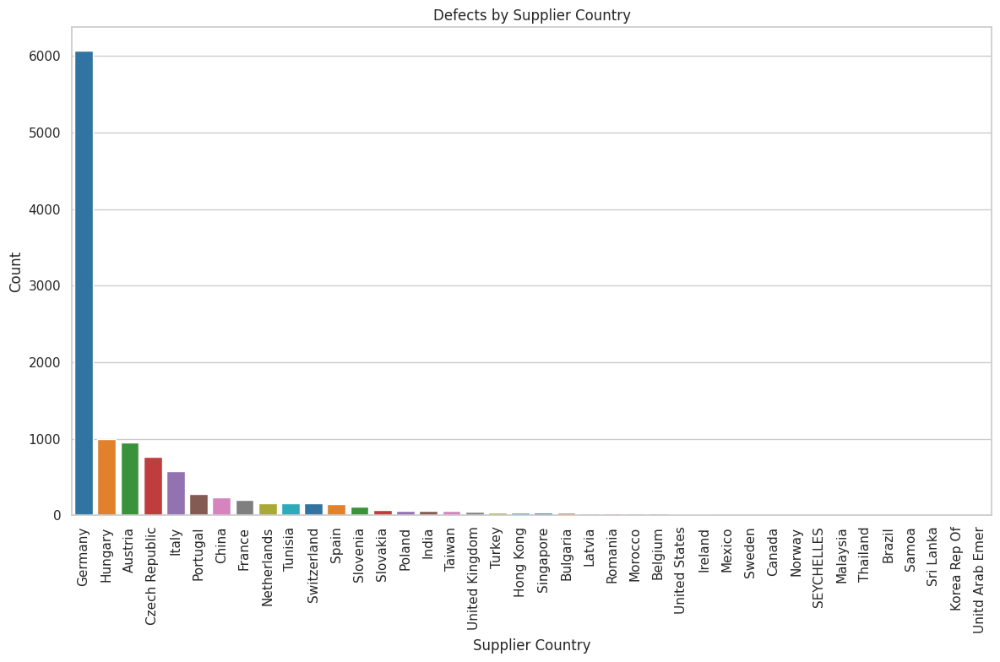

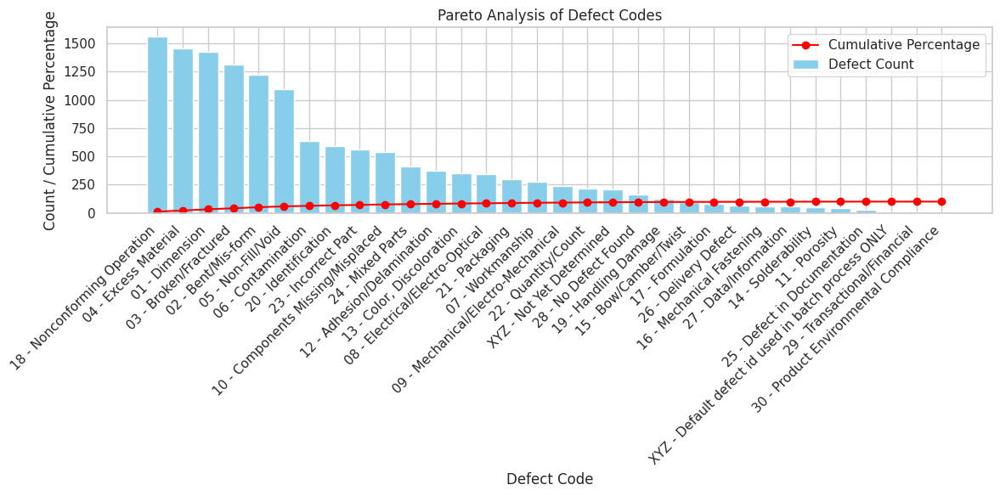

In [152]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('data49.csv')

# Count the occurrences of each Defect Code
defect_code_counts = df['Defect Code'].value_counts()

# Calculate cumulative percentage
defect_code_counts_cum = defect_code_counts.cumsum()
defect_code_counts_percentage = defect_code_counts / defect_code_counts.sum() * 100
defect_code_counts_cum_percentage = defect_code_counts_cum / defect_code_counts.sum() * 100

# Plot Pareto chart
plt.figure(figsize=(12, 6))

# Bar plot for defect counts
plt.bar(defect_code_counts.index, defect_code_counts.values, color='skyblue', label='Defect Count')

# Line plot for cumulative percentage
plt.plot(defect_code_counts.index, defect_code_counts_cum_percentage, color='red', marker='o', label='Cumulative Percentage')

plt.xticks(rotation=45, ha='right')
plt.title('Pareto Analysis of Defect Codes')
plt.xlabel('Defect Code')
plt.ylabel('Count / Cumulative Percentage')
plt.legend()
plt.tight_layout()
plt.show()
b

In [153]:
# Calculate descriptive statistics
time_stats = df[['3D Time', '5D Time']].describe()

print("Descriptive Statistics:")
print(time_stats)


Descriptive Statistics:
            3D Time       5D Time
count  13874.000000  13874.000000
mean       5.808552     18.935647
std       17.961150     24.159160
min       -0.110000      0.000000
25%        0.160000      7.890000
50%        0.810000     11.050000
75%        1.740000     20.210000
max      339.290000    339.290000


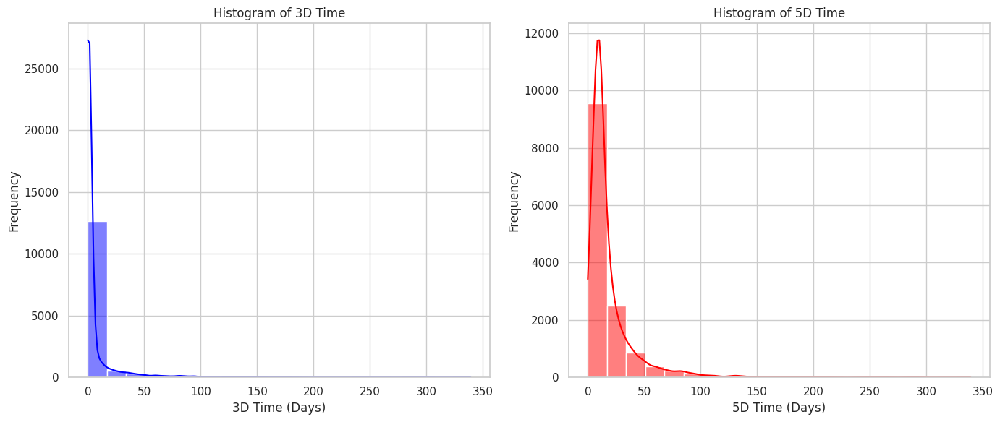

In [155]:
plt.figure(figsize=(14, 6))

# Histogram for 3D Time
plt.subplot(1, 2, 1)
sns.histplot(df['3D Time'], bins=20, kde=True, color='blue')
plt.title('Histogram of 3D Time')
plt.xlabel('3D Time (Days)')
plt.ylabel('Frequency')

# Histogram for 5D Time
plt.subplot(1, 2, 2)
sns.histplot(df['5D Time'], bins=20, kde=True, color='red')
plt.title('Histogram of 5D Time')
plt.xlabel('5D Time (Days)')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


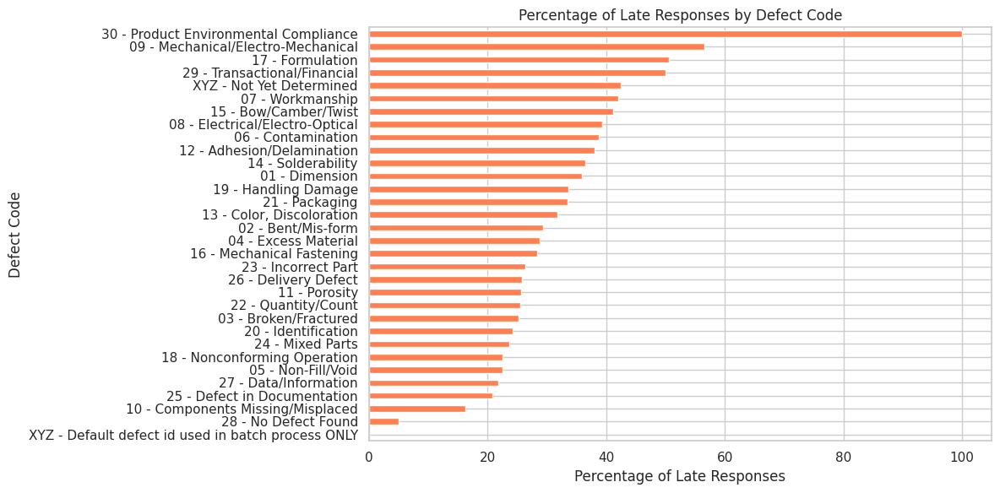

In [156]:
# Convert '5D Lates' to binary for analysis
df['5D Lates'] = df['5D Lates'].apply(lambda x: 1 if x == 'Late' else 0)

# Calculate average delay percentage by Defect Code
delay_by_defect_code = df.groupby('Defect Code')['5D Lates'].mean() * 100

# Plot the percentage of late responses by Defect Code
plt.figure(figsize=(12, 6))
delay_by_defect_code.sort_values().plot(kind='barh', color='coral')
plt.title('Percentage of Late Responses by Defect Code')
plt.xlabel('Percentage of Late Responses')
plt.ylabel('Defect Code')
plt.tight_layout()
plt.show()
